# Plot Customisation with `doped`

All the plotting functions in `doped` are made to be as customisable as possible, and also return the `Matplotlib` `Figure` object, so that you can further customise the plot as you see fit. 

```{tip}
You can run this notebook interactively through [Google Colab](https://colab.research.google.com/github/SMTG-Bham/doped/blob/develop/examples/plotting_customisation_tutorial.ipynb) or [Binder](https://mybinder.org/v2/gh/SMTG-Bham/doped/develop?urlpath=tree/examples/plotting_customisation_tutorial.ipynb) – just click the links! (Then uncomment the `!pip install...` cell).
```

In [1]:
# # If running on Colab; uncomment to install doped, clone the repo to download the example data and cd in to examples folder:
# !pip install doped
# !git clone https://github.com/SMTG-Bham/doped
# %cd doped/examples

## Defect Formation Energy Plotting

In [1]:
%matplotlib inline
from monty.serialization import loadfn
CdTe_thermo = loadfn("CdTe/CdTe_thermo_wout_meta.json.gz")  # load our DefectThermodynamics object

Basic formation energy plot:

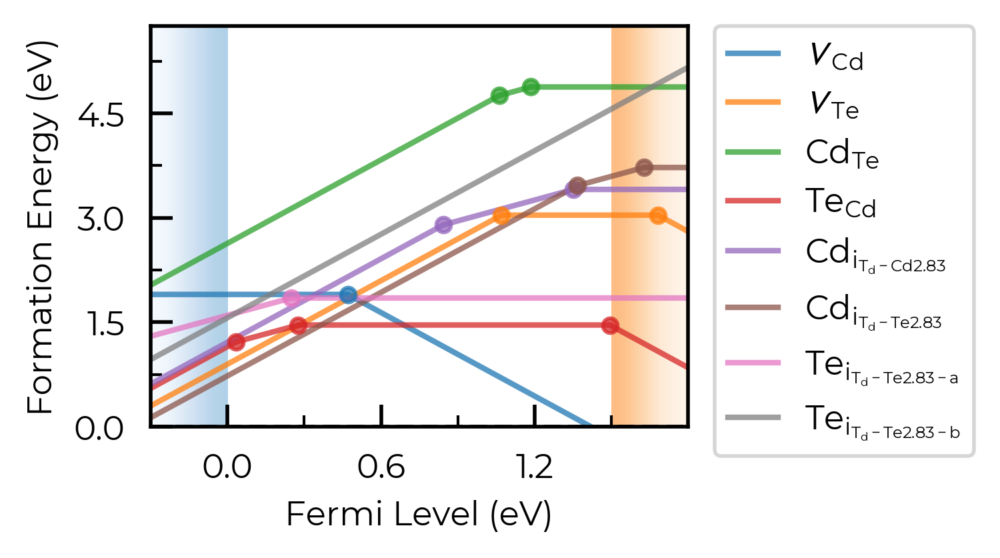

In [3]:
fig = CdTe_thermo.plot(limit="Te-rich")  # plot at the Te-rich chemical potential limifig

In [4]:
# run this cell to see the possible arguments for this function (or go to the python API documentation)
CdTe_thermo.plot?

Signature:
CdTe_thermo.plot(
    chempots: dict | None = None,
    limit: str | None = None,
    el_refs: dict | None = None,
    all_entries: bool | str = False,
    unstable_entries: bool | str = 'not shallow',
    defect_subset: list[str] | str | None = None,
    chempot_table: bool | None = None,
    style_file: str | pathlib._local.Path | None = None,
    xlim: tuple | None = None,
    ylim: tuple | None = None,
    fermi_level: float | None = None,
    include_site_info: bool = False,
    colormap: str | matplotlib.colors.Colormap | None = None,
    linestyles: str | list[str] = '-',
    auto_labels: bool = False,
    filename: str | pathlib._local.Path | None = None,
    **kwargs,
) -> matplotlib.figure.Figure | list[matplotlib.figure.Figure]
Docstring:
Produce a defect formation energy vs Fermi level plot (a.k.a. a defect
formation energy / transition level diagram), returning the
``matplotlib`` ``Figure`` object to allow further plot customisation.

Note that the band edge pos

### `dist_tol`

In the above plot, we see `doped` classified Te interstitials into having two separate defect sites. This is dictated by the `dist_tol` parameter in `DefectThermodynamics` (= 1.5 Å by default), which groups together defects which have distances between equivalent defect sites within this tolerance. 
In this case, this is because Te interstitials adopt [split-interstitial dimer structures](https://pubs.rsc.org/en/content/articlelanding/2022/fd/d2fd00043a) for the +1 and neutral charge states, but a different conventional interstitial type structure for the +2 charge state.  
We can see this if we use the `get_min_dist_between_equiv_sites` convenience function:

In [5]:
from doped.utils.symmetry import get_min_dist_between_equiv_sites

dist = get_min_dist_between_equiv_sites(CdTe_thermo["Te_i_Td_Te2.83_+2"], CdTe_thermo["Te_i_Td_Te2.83_0"])
print(f"Distance between Te_i +2 and 0 equivalent sites: {dist:.2f} Å")

Distance between Te_i +2 and 0 equivalent sites: 1.57 Å


Let's increase it to 1.6 Å here to group these Te interstitials together:

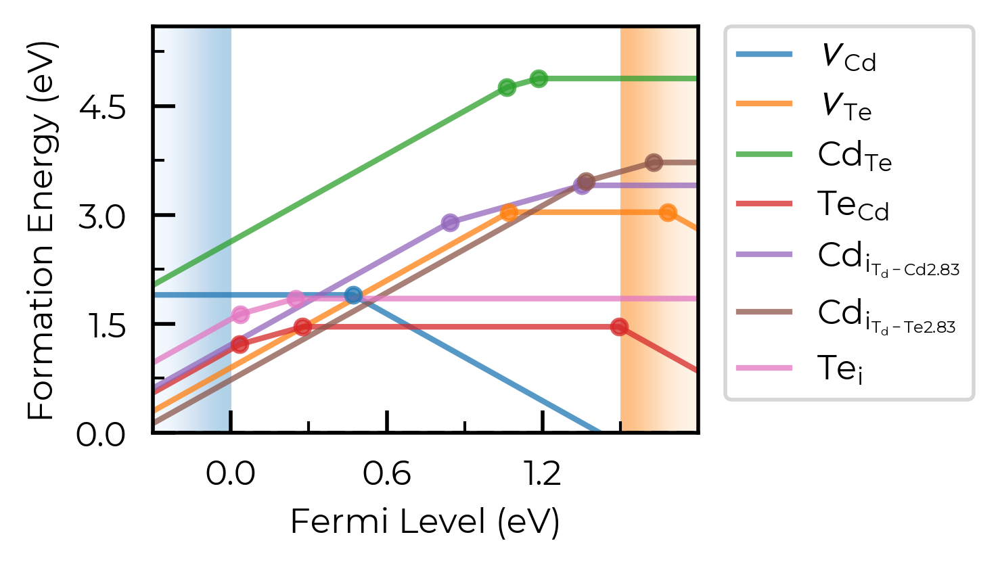

In [6]:
CdTe_thermo.dist_tol = 1.6
fig = CdTe_thermo.plot(limit="Te-rich")

If we had many inequivalent defects in a system (e.g. in low-symmetry/complex systems such as [Sb₂Se₃](https://doi.org/10.1016/j.joule.2024.05.004)), we can set `dist_tol` to a high value to merge together these many inequivalent defects so that our formation energy plot just shows the lowest energy species of each defect type. Let's quickly look at monoclinic Sb₂O₅ ([a promising Sb(V)-based transparent conducting oxide](https://doi.org/10.1021/acs.chemmater.3c03257), with several inequivalent sites) as an example case of this:

In [7]:
sb2o5_thermo = loadfn("../tests/data/Sb2O5/sb2o5_thermo.json.gz")  # load our pre-computed Sb2O5 DefectThermodynamics

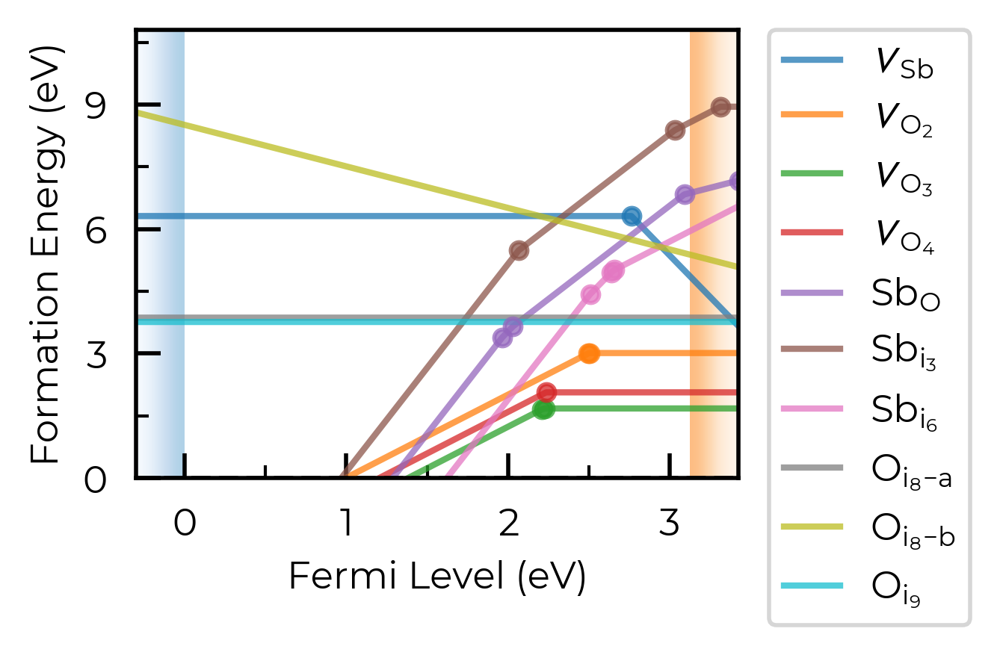

In [8]:
fig = sb2o5_thermo.plot(limit="O-poor")

Let's set `dist_tol` to 2.5 , which will merge all inequivalent O interstitials and Sb interstitials in this case:

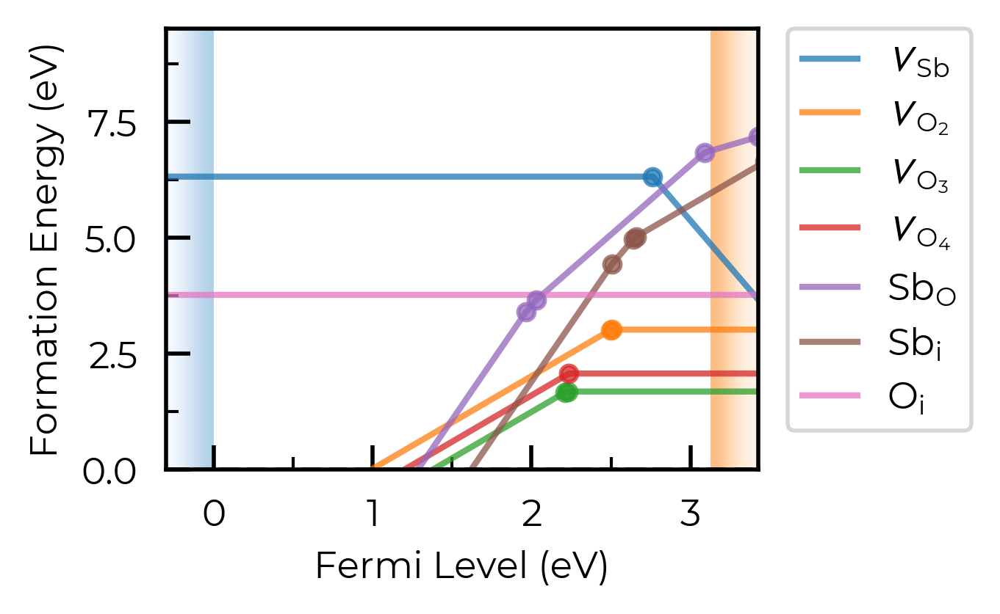

In [9]:
sb2o5_thermo.dist_tol = 2.5
fig = sb2o5_thermo.plot(limit="O-poor")

If we set `dist_tol` even larger, to 3 Å here, this will merge all inequivalent O vacancies as well, so that only the lowest energy states are shown:

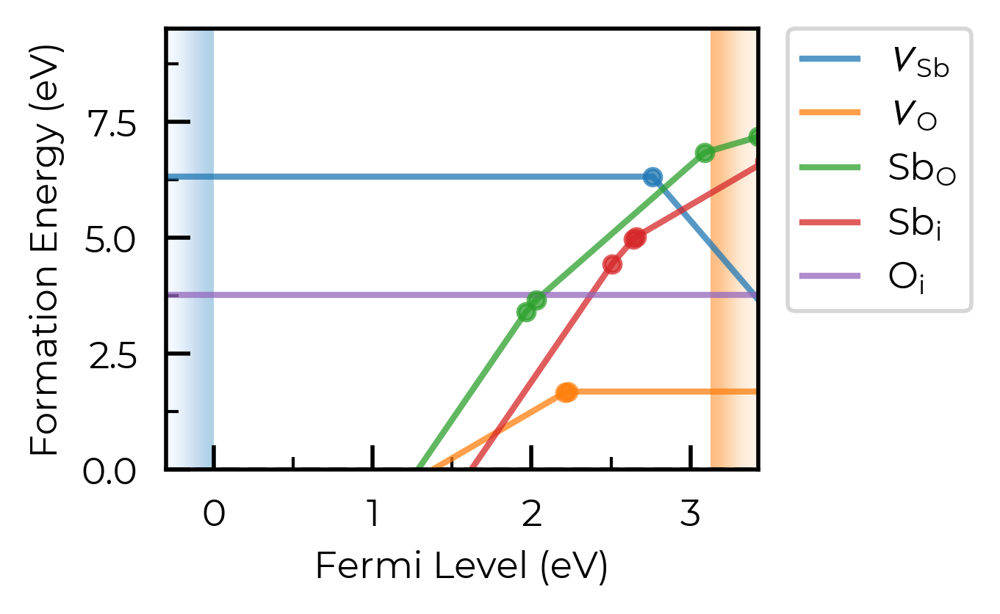

In [10]:
sb2o5_thermo.dist_tol = 3
fig = sb2o5_thermo.plot(limit="O-poor")

```{note}
`dist_tol` is used to control the grouping together of different defect entries (different charge states, and/or ground and metastable states (different spin or geometries)) which correspond to the same defect type (e.g. interstitials at a given site), which are then used in plotting, transition level analysis and defect concentration calculations; e.g. in the frozen defect approximation, the total concentration of a given defect type group is calculated at the annealing temperature, and then the equilibrium relative population of the constituent entries is recalculated at the quenched temperature.

`dist_tol` is also used to cluster defects of _all types_ when determining site competition in defect concentration calculations; see e.g. [`get_fermi_level_and_concentrations`](https://doped.readthedocs.io/en/latest/doped.thermodynamics.html#doped.thermodynamics.DefectThermodynamics.get_fermi_level_and_concentrations) docstring.
```

### `defect_subset`

We can use the `defect_subset` argument to specify a string or list of strings, where only defects whose name contains at least one of the given (sub)strings will be plotted.

For example, let's plot just the vacancy defects:

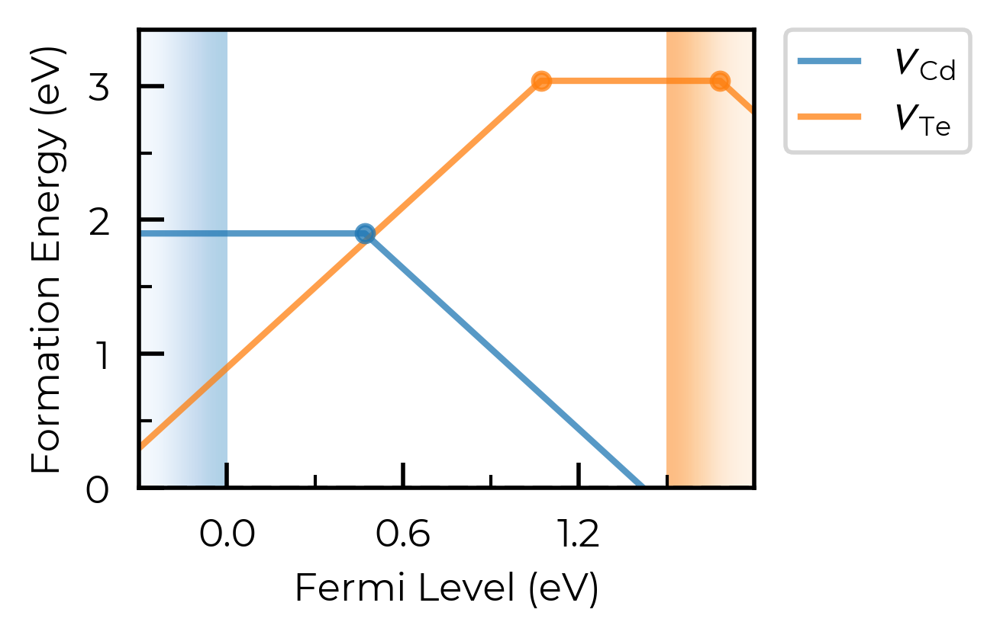

In [11]:
fig = CdTe_thermo.plot(limit="Te-rich", defect_subset="v_")  # 'v_' to match vacancies

Alternatively, we could achieve the same result by manually creating a vacancies-only `DefectThermodynamics` object:

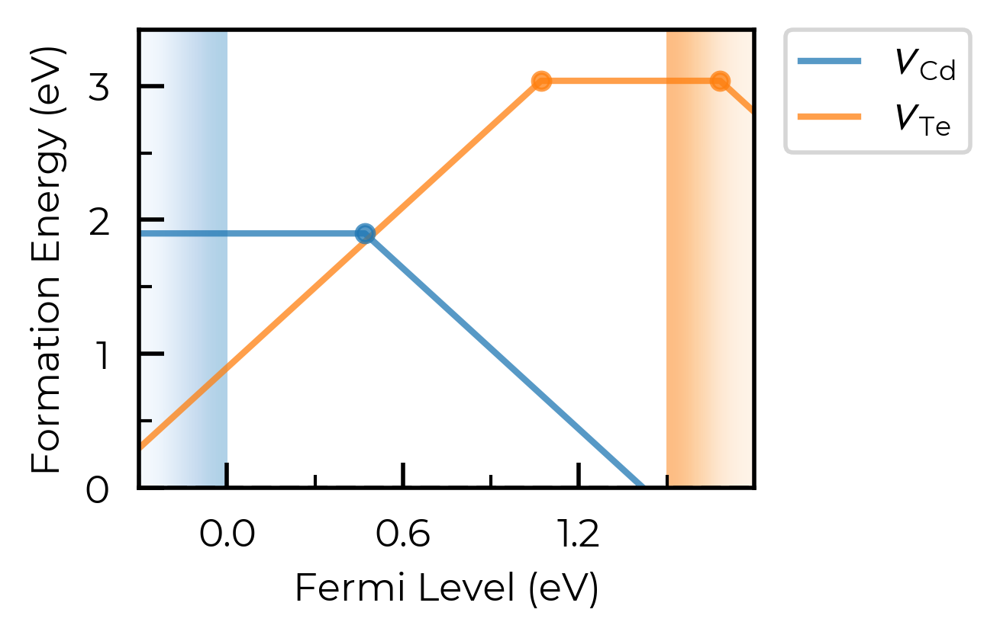

In [12]:
from doped.thermodynamics import DefectThermodynamics

vacancies_only_thermo = DefectThermodynamics(
    [entry for name, entry in CdTe_thermo.defect_entries.items() if "v_" in name],
    chempots=CdTe_thermo.chempots,
)
fig = vacancies_only_thermo.plot(limit="Te-rich")

### `all_entries`

We can set `all_entries = True` to show the full formation energy lines for all defect species, not just the lowest energy charge states. This can be useful for analysing metastable defect states, but can also be quite messy when we are plotting many defects at once. 
For this case, let's plot just the Cd vacancy defects:

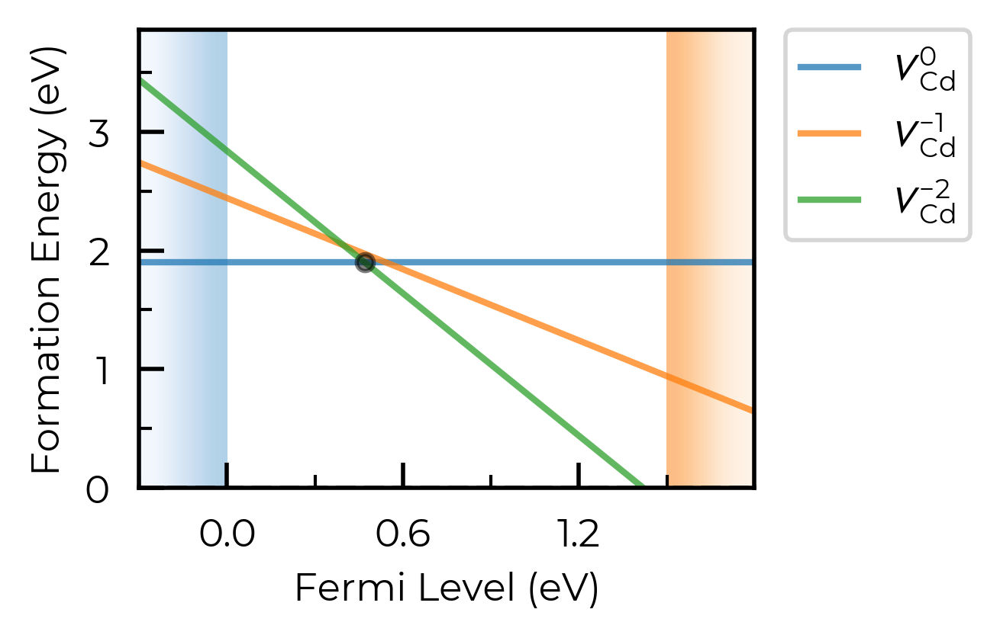

In [13]:
fig = CdTe_thermo.plot(all_entries=True, limit="Te-rich", defect_subset="v_Cd")

We can instead set `all_entries = "faded"` to show the full formation energy lines for all defect species, but with all metastable states faded out in grey:

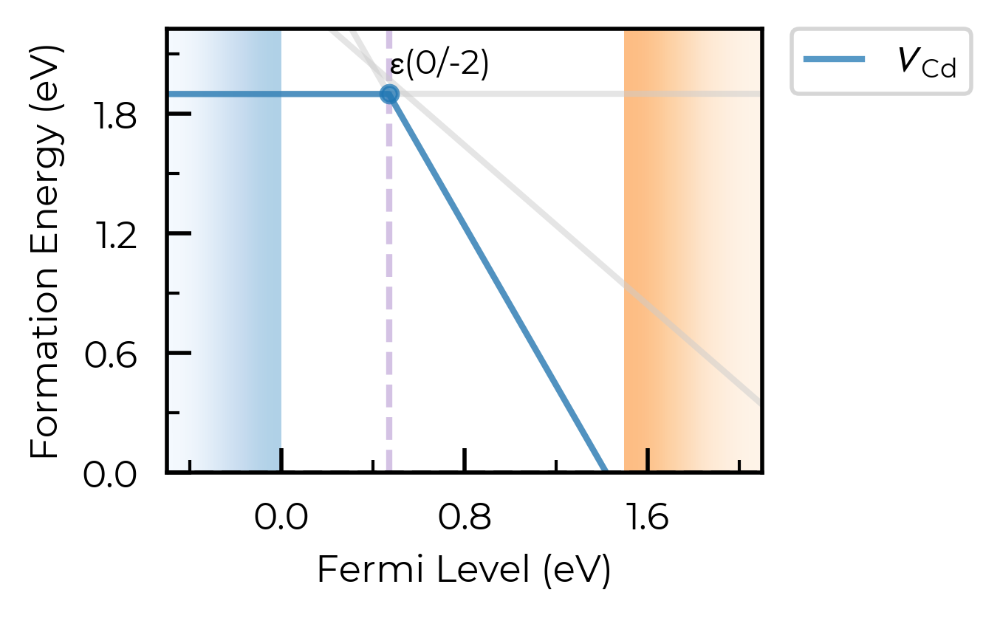

In [14]:
fig = CdTe_thermo.plot(
    auto_labels=True,
    xlim=(-0.5, 2.1),
    all_entries="faded",
    limit="Te-rich",
    defect_subset="v_Cd"
)
ax = fig.gca()
ax.axvline(0.47, ls="--", c="C4", alpha=0.4, zorder=-1)  # add a vertical line at the transition level

### `chempots` & `el_refs`

We can also set the chemical potentials to be used in the plot directly in the plotting function (or can of course adjust `DefectThermodynamics.chempots/el_refs` directly):

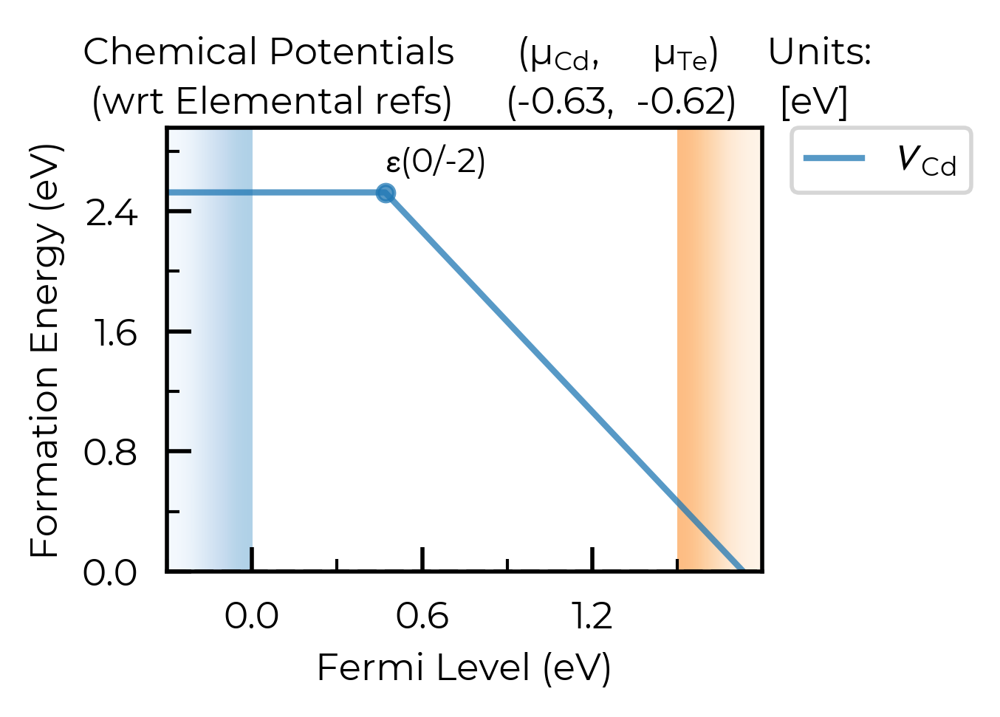

In [15]:
# we can always set/overwrite `chempots` in the plotting/tabulation functions like this too:
fig = CdTe_thermo.plot(
    chempots={"Cd": -0.6255, "Te": -0.625},  # midpoint between Te/Cd-rich
    el_refs=CdTe_thermo.chempots.get("elemental_refs"),
    auto_labels=True,
    chempot_table=True,  # set this to True to show the chempots being used!
    defect_subset="v_Cd"
)

### `limit`

The `limit` parameter specifies the chemical potential limit for which to
plot formation energies. This can be either:
- `None`, in which case plots are generated for all limits in ``chempots``.
- "X-rich"/"X-poor" where X is an element in the system, in which case the most X-rich/poor limit will be used (e.g. "Li-rich").
- A key in the ``(DefectThermodynamics.)chempots["limits"]`` dictionary.

The latter two options can only be used if ``chempots`` is in the `doped` format (see chemical potentials tutorial). 

In [16]:
# print the chemical potential limits
print(CdTe_thermo.chempots["limits"].keys())

dict_keys(['Cd-CdTe', 'CdTe-Te'])


In this case, we can plot the Cd-rich limit by setting `limit="Cd-rich"`, `limit="Cd-CdTe"` (the Cd-rich limit here) or by just manually setting the chemical potentials to this limit:

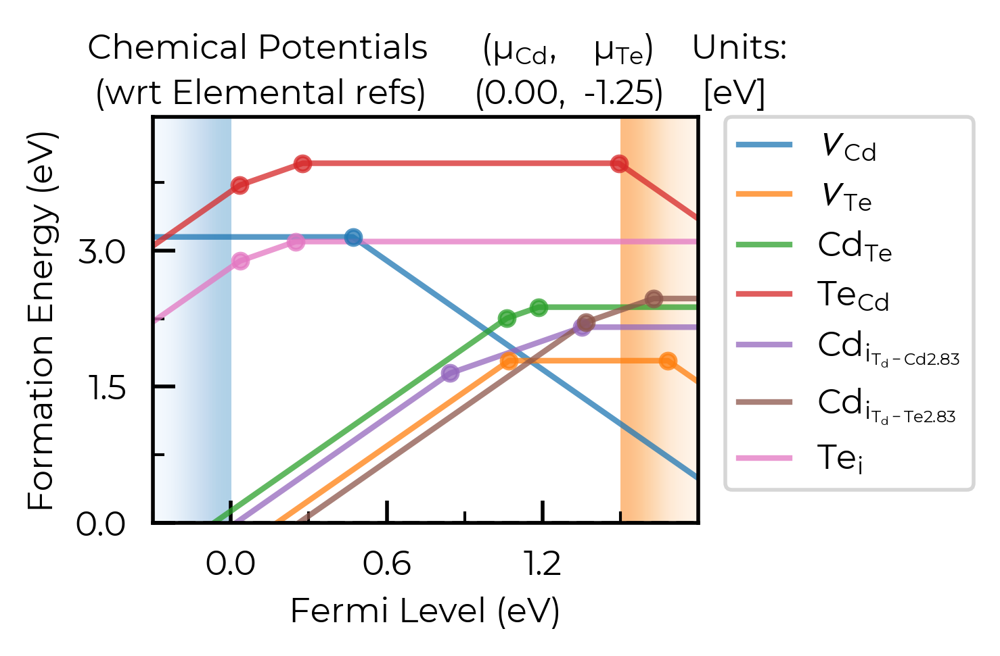

In [51]:
fig = CdTe_thermo.plot(limit="Cd-CdTe", chempot_table=True)

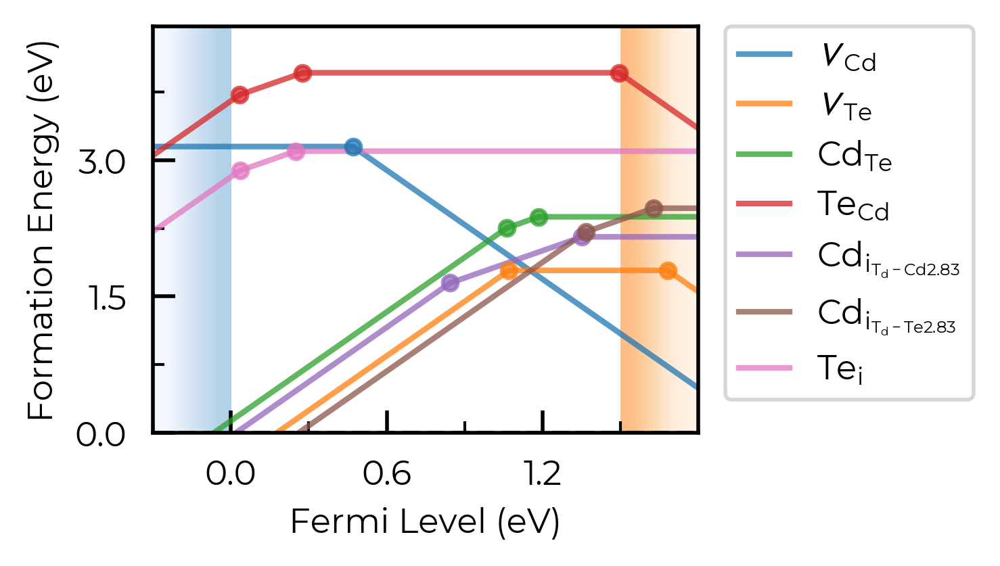

In [52]:
# manual Cd-rich chempots:
fig = CdTe_thermo.plot(
    chempots=CdTe_thermo.chempots["limits_wrt_el_refs"]["Cd-CdTe"],
    el_refs=CdTe_thermo.chempots["elemental_refs"]
)

### `unstable_entries`

We can use the ``unstable_entries`` argument to control the plotting or omission of shallow ('perturbed host') and unstable defect charge states. See the [Electronic Structure Analysis](https://doped.readthedocs.io/en/latest/Tips.html#eigenvalue-electronic-structure-analysis) section of the `doped` Tips page for more info on shallow defect states.
The default setting is ``unstable_entries = "not shallow"``, meaning entries which are
detected to be shallow ('perturbed host') states and unstable for Fermi levels in the band gap are omitted from plotting for clarity & accuracy.

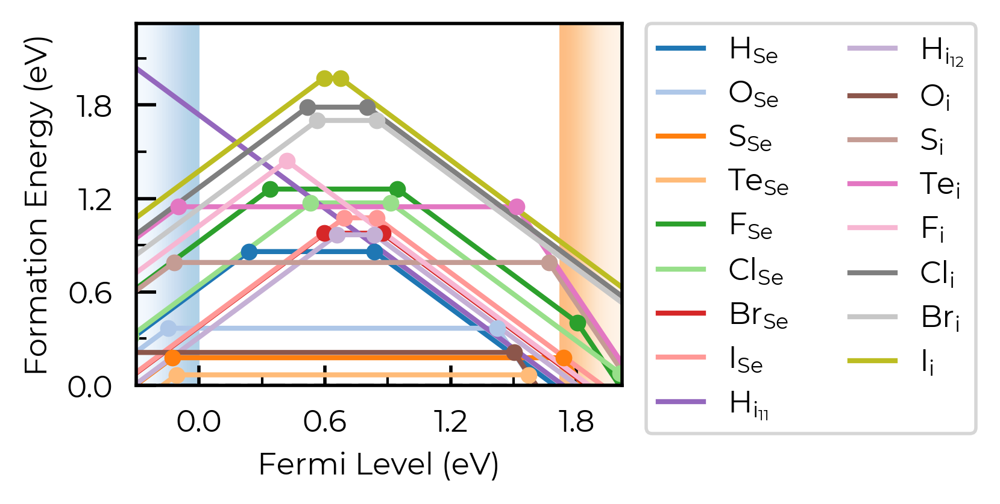

In [19]:
from doped.thermodynamics import DefectThermodynamics
Se_extrinsic_thermo = DefectThermodynamics.from_json(  # load our DefectThermodynamics object
    "../tests/data/Se_Ext_No_Pnict_Thermo.json.gz")

fig = Se_extrinsic_thermo.plot(unstable_entries=True)  # no pruning of shallow/unstable states

We can see with the default ``unstable_entries="not shallow"`` below here, some +1 charge states for chalcogen substitutions/interstitials (from this [paper on defects in Selenium](https://doi.org/10.1039/D4EE04647A)) are now omitted, being unstable for in-gap Fermi levels and having been automatically detected as shallow defects by `doped`'s eigenvalue analysis:

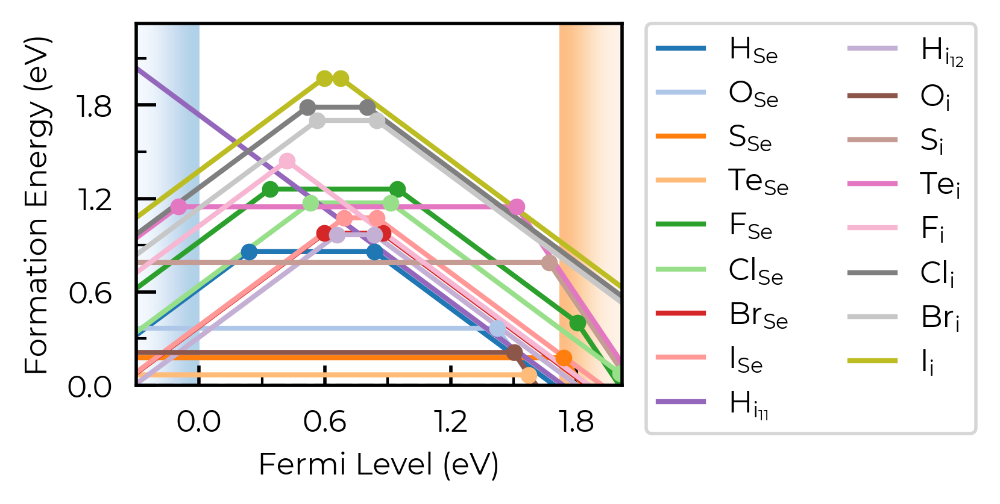

In [20]:
fig = Se_extrinsic_thermo.plot(unstable_entries="not shallow")  # default

In [21]:
Se_extrinsic_thermo["sub_1_O_on_Se_1"].is_shallow  # confirm shallow classification

True

See the [API docs](https://doped.readthedocs.io/en/latest/doped.thermodynamics.html#doped.thermodynamics.DefectThermodynamics.plot) / docstring for more info on the available ``unstable_entries`` choices!

### `include_site_info`

The ``include_site_info`` argument controls the use of defect site information in the defect names (i.e. legend in the formation energy plots). The default setting (``None``) omits site info unless needed to disambiguate distinct (grouped) defects:

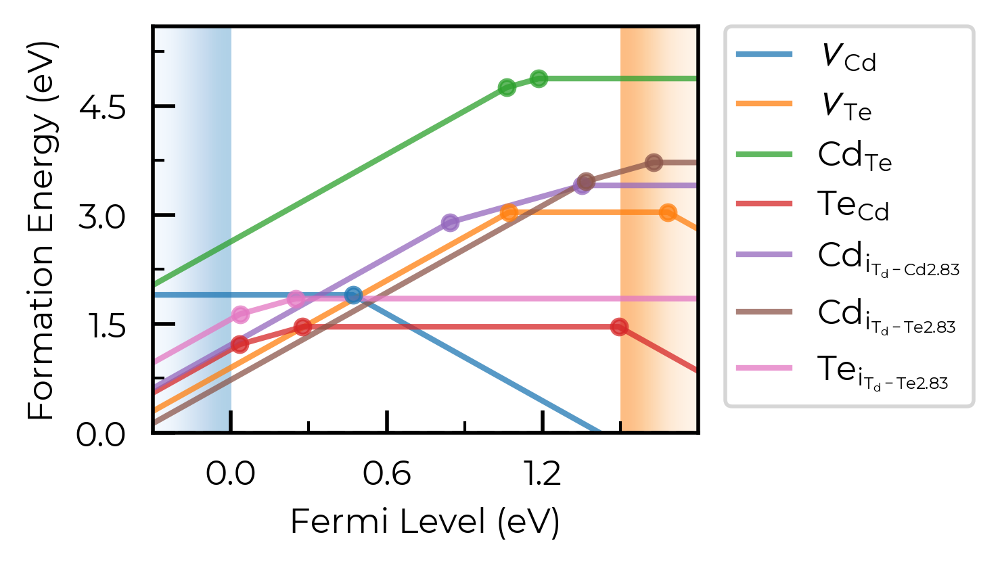

In [85]:
# show site info in all cases where available (interstitial defects here):
fig = CdTe_thermo.plot(limit="Te-rich", include_site_info=True)

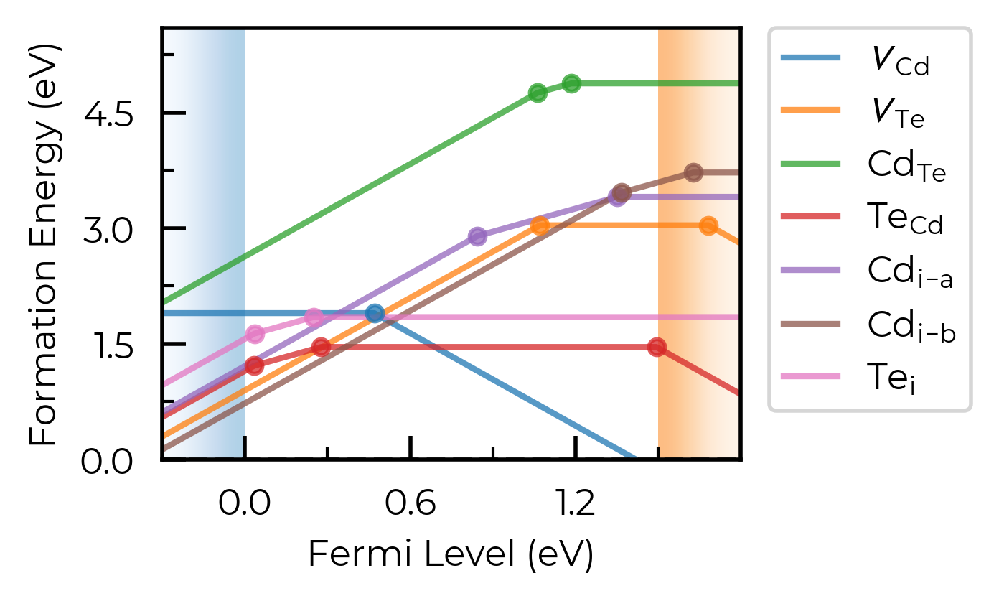

In [86]:
# don't show site info -- here the labels "Cd_i-a" and "Cd_i-b" are used to differentiate instead, while "Te_i" needs no additional labelling to disambiguate:
fig = CdTe_thermo.plot(limit="Te-rich", include_site_info=False)

### `colormap`

We can set different (qualitative) colour maps for the plots. This can be a string name of a `Matplotlib` colormap (see [here](https://matplotlib.org/stable/users/explain/colors/colormaps.html#qualitative)), or a `Colormap` object:

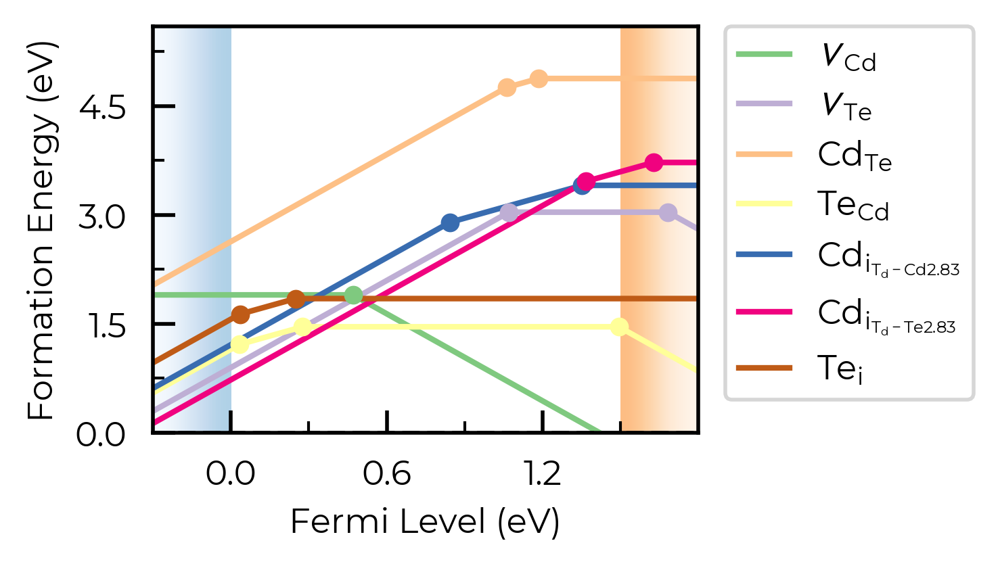

In [53]:
fig = CdTe_thermo.plot(limit="Te-rich", colormap="Accent")

In [23]:
from matplotlib.colors import ListedColormap

custom_cmap = ListedColormap(["#D4447E", "#E9A66C", "#507BAA", "#5FABA2", "#63666A", "#A3A3A3", "#FFD700"])

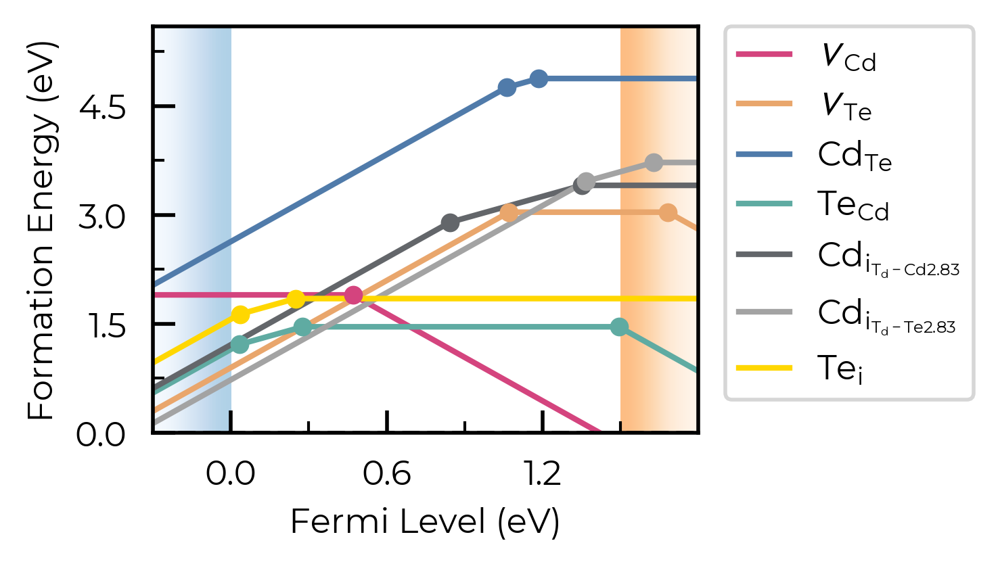

In [54]:
fig = CdTe_thermo.plot(limit="Te-rich", colormap=custom_cmap)

### `linestyles` (and `dist_tol`, `colormap`)

In this example, we plot the formation energies of impurity elements as interstitials in trigonal Selenium -- a [promising candidate for indoor and tandem PV, investigated using `doped` & `ShakeNBreak`](https://doi.org/10.1039/D4EE04647A):

In [2]:
from doped.thermodynamics import DefectThermodynamics
Se_extrinsic_thermo = DefectThermodynamics.from_json(
    "Se/Se_Amalgamated_Extrinsic_Thermo.json.gz"
)  # load our DefectThermodynamics object

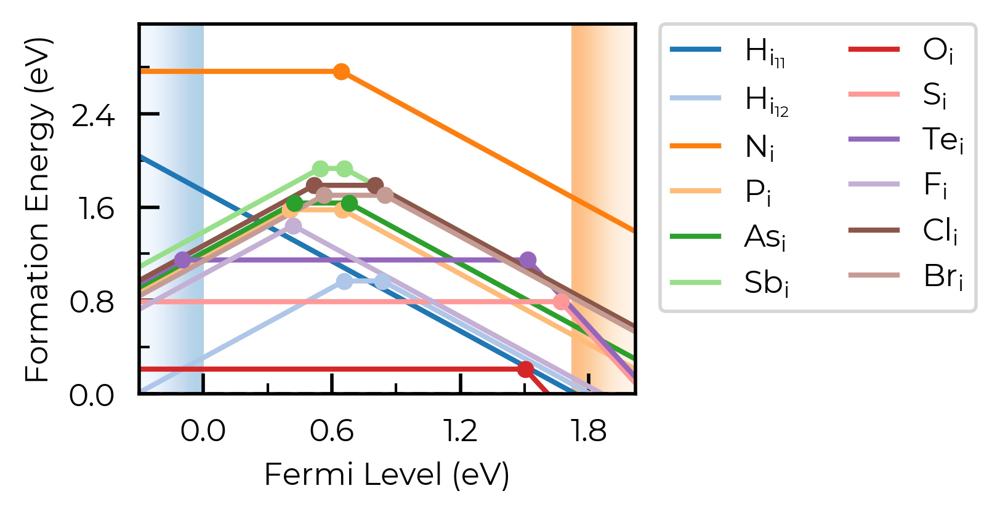

In [3]:
# interstitials only first:
from doped.core import Interstitial
Se_extrinsic_interstitials_thermo = DefectThermodynamics(
    defect_entries=[entry for entry in Se_extrinsic_thermo.defect_entries.values()
                    if isinstance(entry.defect, Interstitial)],
    chempots = Se_extrinsic_thermo.chempots,
)
fig = Se_extrinsic_interstitials_thermo.plot()

Here, we have two nearby-but-distinct interstitial sites for hydrogen interstitials. For now, let's increase `dist_tol` to merge these together, and just show the lowest energy state for each distinct defect type: 

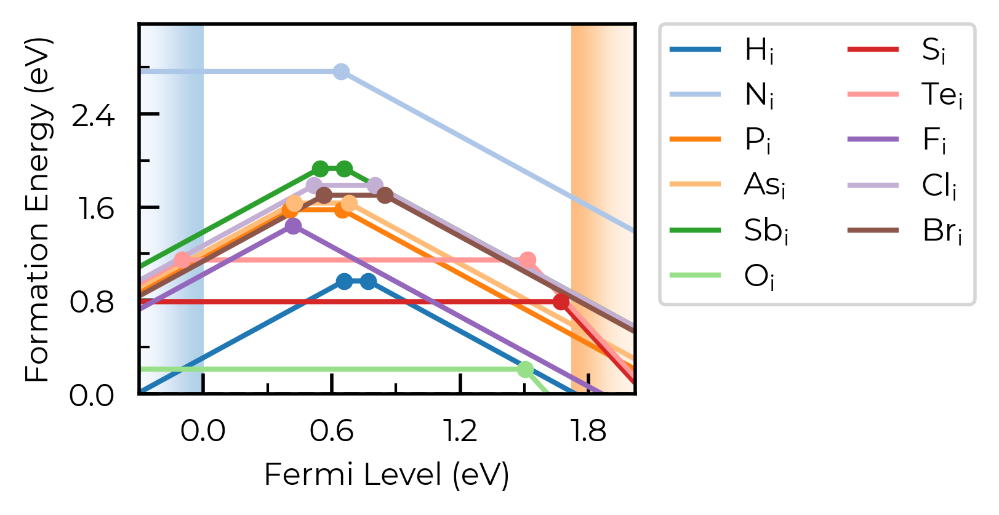

In [4]:
Se_extrinsic_interstitials_thermo.dist_tol = 2
fig = Se_extrinsic_interstitials_thermo.plot()

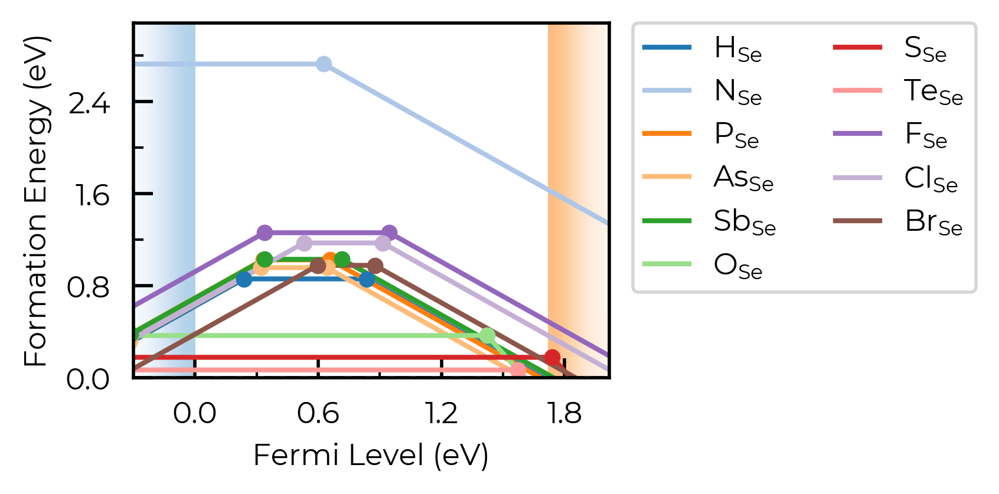

In [6]:
from doped.core import Substitution
Se_extrinsic_substitutions_thermo = DefectThermodynamics(
    defect_entries=[entry for entry in Se_extrinsic_thermo.defect_entries.values()
                    if isinstance(entry.defect, Substitution)],
    chempots = Se_extrinsic_thermo.chempots,
)
fig = Se_extrinsic_substitutions_thermo.plot()

Here, we have a number of consistent trends in behaviour for the impurities, as a function of periodic group and row (hydrogen vs pnictogens vs chalcogens vs halogens), so it would aid our analysis to group the defects together in this way. We can use the `colormap` and `linestyles` option to do this:

```{tip}
By default, defect entries in `DefectThermodynamics.defect_entries` (and thus plotting) are ordered by defect type (vacancies, substitutions, interstitials), then by order of appearance of the elements in the host composition, then by periodic group, then by atomic number (and then by charge state).
This is seen above, where the defects are ordered: H (group 1), N, P, As, Sb (group 15, descending), O, S, Te (group 16, descending), F, Cl, Br (group 17, descending). This makes plotting customisation based on periodic table positioning nice and easy, as shown below.
```


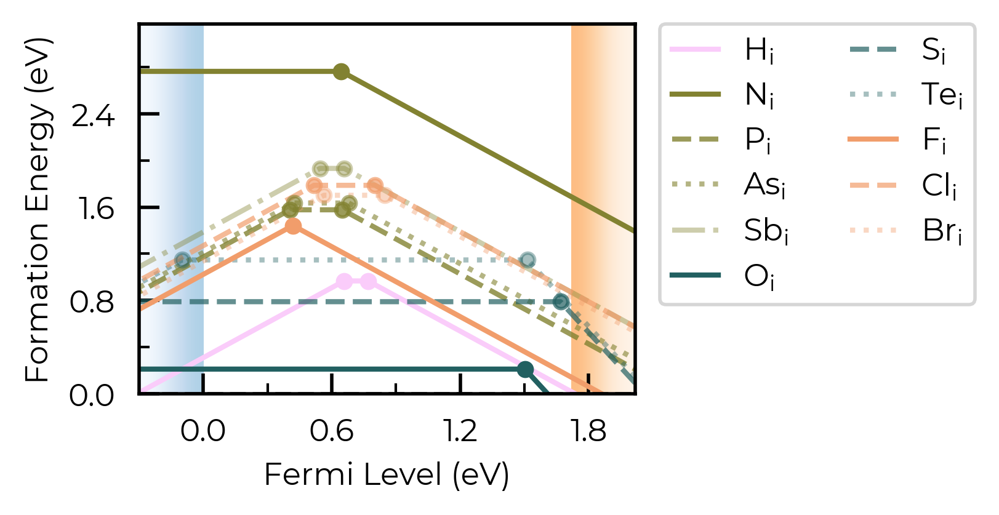

In [28]:
# order of defects in plot: H, N, P, As, Sb, O, S, Te, F, Cl, Br
from matplotlib.colors import ListedColormap
import cmcrameri.cm as cmc

# choose our colours for each periodic group:
colors = cmc.cmaps.get("batlowS").colors  # choose colormap (www.fabiocrameri.ch/colourmaps)
H_color, pnict_color, chalc_color, halogen_color = colors[1:5]  # choose colors
H_pnict_chalc_halogen_colormap = ListedColormap(
    [
        H_color,  # RGB color
        # here we also adjust the alpha value to decrease the opacity of each line as we
        # move down the periodic group:
        *[(*pnict_color, 1 - 0.2 * i) for i in range(4)],  # RGBA color (RGB + alpha)
        *[(*chalc_color, 1 - 0.3 * i) for i in range(3)],
        *[(*halogen_color, 1 - 0.3 * i) for i in range(3)],
    ]
)
# choose linestyles
linestyles = [  # solid for first of each group, then dashed, dotted, dashdot
    "-",
    "-",
    "--",
    ":",
    "-.",
    "-",
    "--",
    ":",
    "-",
    "--",
    ":",
]

fig = Se_extrinsic_interstitials_thermo.plot(
    colormap=H_pnict_chalc_halogen_colormap,
    linestyles=linestyles,
)

Cool. Let's plot the substitutions like this too:

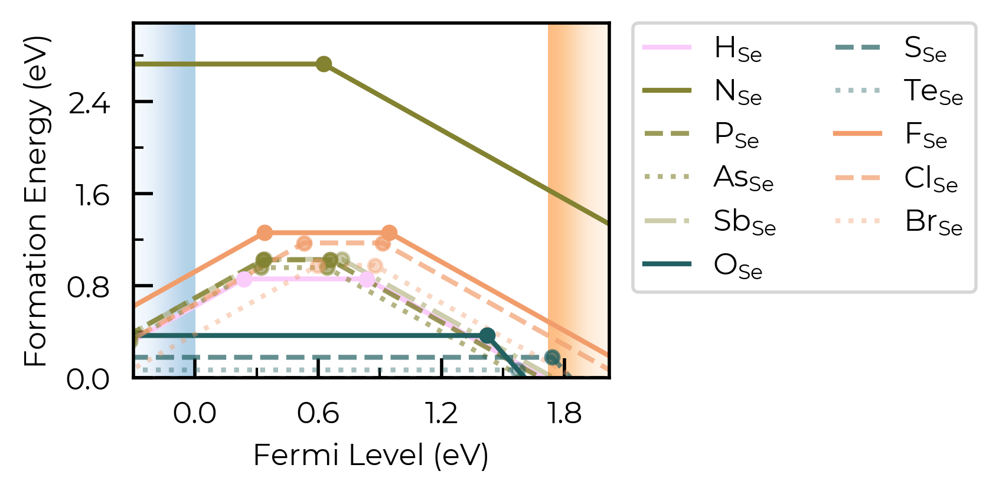

In [29]:
from doped.core import Substitution

Se_extrinsic_substitutions_thermo = DefectThermodynamics(
    defect_entries=[
        entry
        for entry in Se_extrinsic_thermo.defect_entries.values()
        if isinstance(entry.defect, Substitution)
    ],
    chempots=Se_extrinsic_thermo.chempots,
)
fig = Se_extrinsic_substitutions_thermo.plot(
    colormap=H_pnict_chalc_halogen_colormap,
    linestyles=linestyles,
)  # same number of defects to plot, so can use same colormap and linestyles

### `style_file`

We can adjust the overall style of the plot by using a custom `matplotlib` style (`mplstyle`) file:

In [30]:
with open("custom_style.mplstyle", "w") as f:
    f.write("ytick.right : True\nxtick.top : True\nfont.sans-serif : Helvetica")

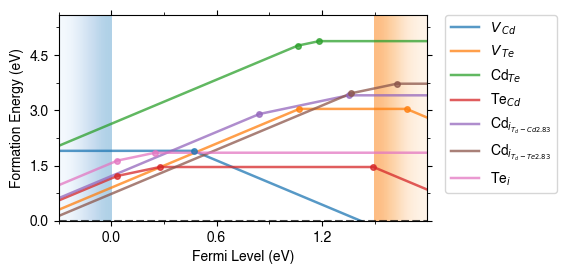

In [55]:
fig = CdTe_thermo.plot(limit="Te-rich", style_file="custom_style.mplstyle")

### `auto_labels`

We can include automatic labels for the transition levels:
(as you can see, these get very messy when we are plotting many defects, so usually best to use only with a small number of defects)

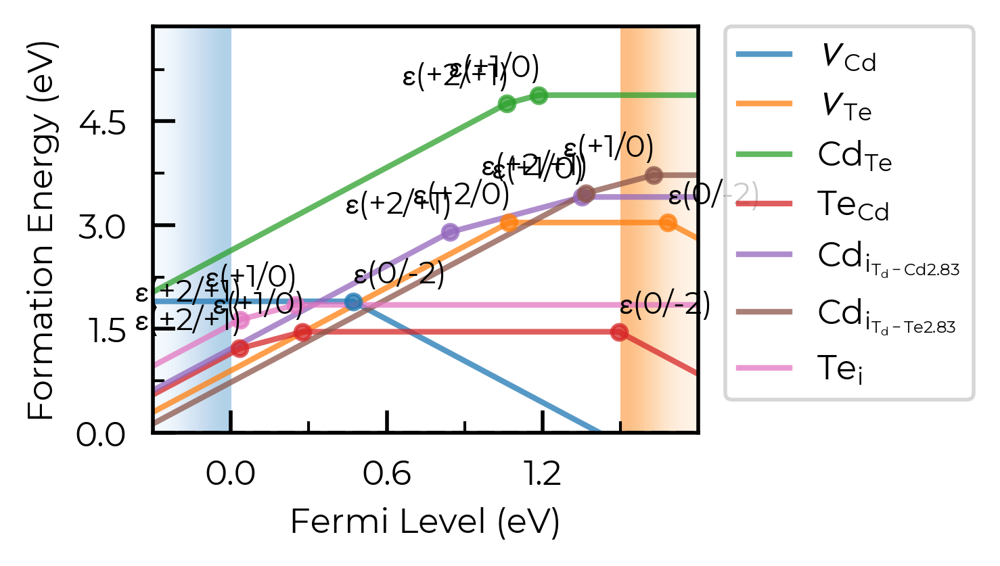

In [56]:
fig = CdTe_thermo.plot(limit="Te-rich", auto_labels=True)

### `chempot_table`

We can control whether or not to show the chemical potentials above the plot, which can be useful when looking at behaviour under different chemical potential limits:

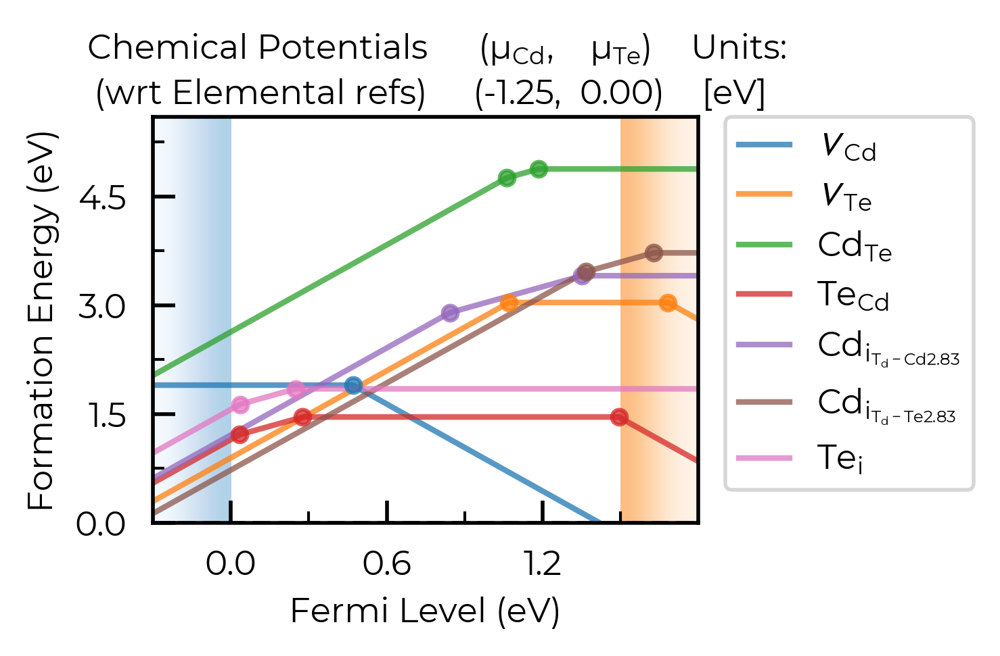

In [57]:
fig = CdTe_thermo.plot(limit="Te-rich", chempot_table=True)

### `xlim` & `ylim`

We can adjust the axis limits:

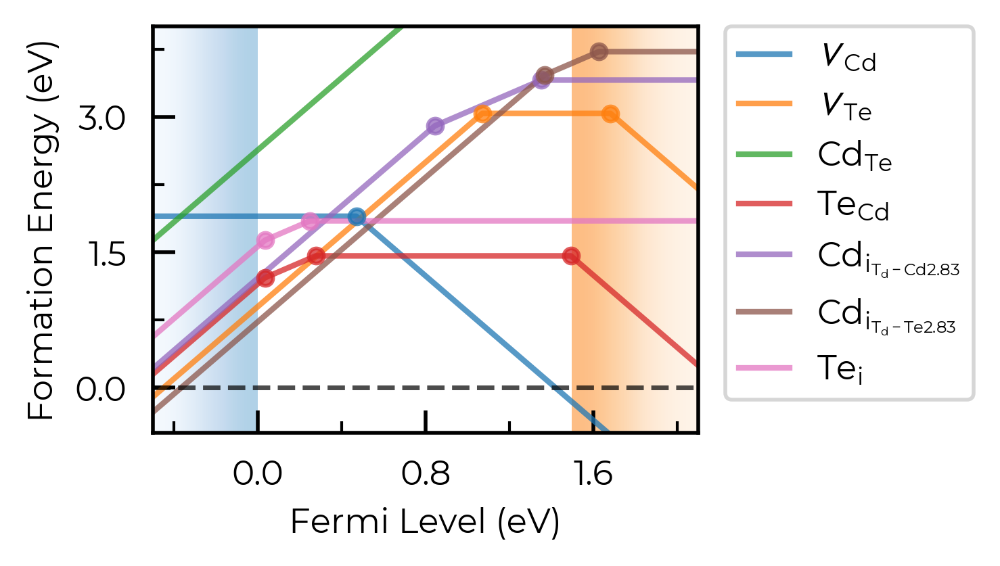

In [58]:
fig = CdTe_thermo.plot(limit="Te-rich", xlim=(-0.5, 2.1), ylim=(-0.5, 4.0))

### `fermi_level` / Editing Output Figure

We can show a vertical line at the predicted Fermi level position (see the `doped` thermodynamics tutorial for details on how we might go about doing this):

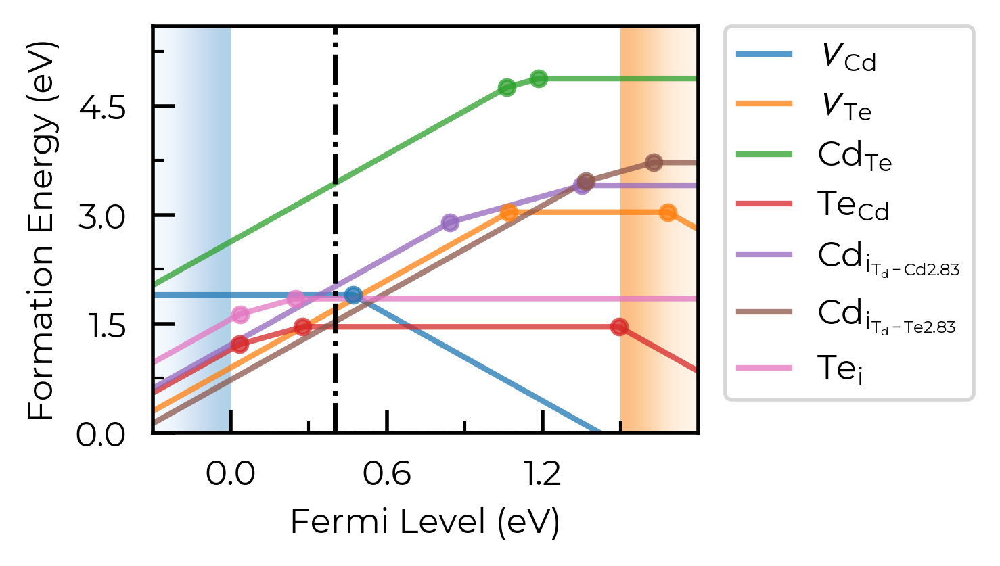

In [79]:
fig = CdTe_thermo.plot(limit="Te-rich", fermi_level=0.4)

The same effect can be achieved by manually editing the output ``matplotlib`` ``Figure``:

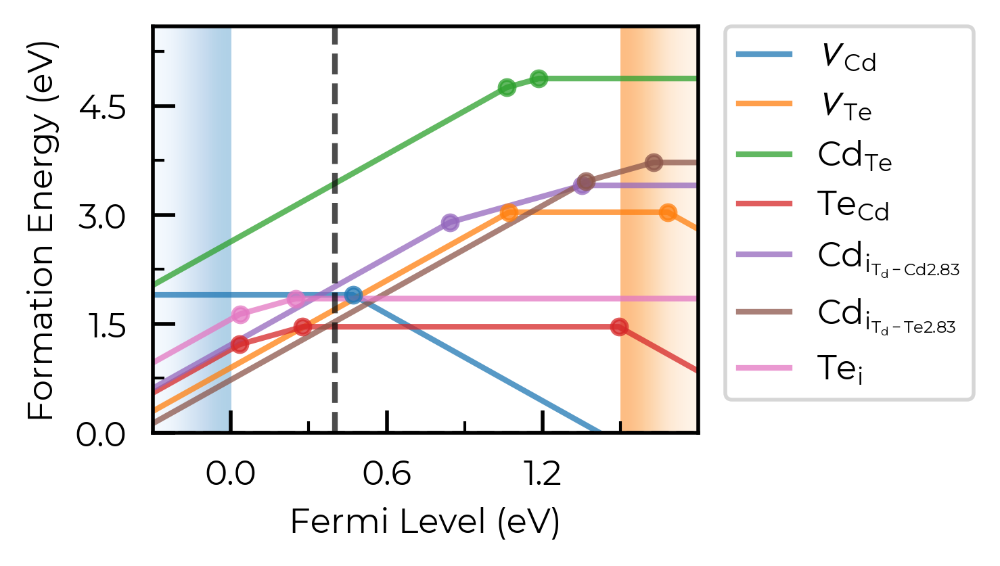

In [82]:
fig = CdTe_thermo.plot(limit="Te-rich")
fig.gca().axvline(0.4, c="k", linestyle="--", alpha=0.7)

```{tip}
All ``doped`` plotting functions return the ``matplotlib`` ``Figure`` as part of the outputs, allowing you to further edit and customise the plot as desired.
```

### `filename`

We can set `filename` to save the plot to file:

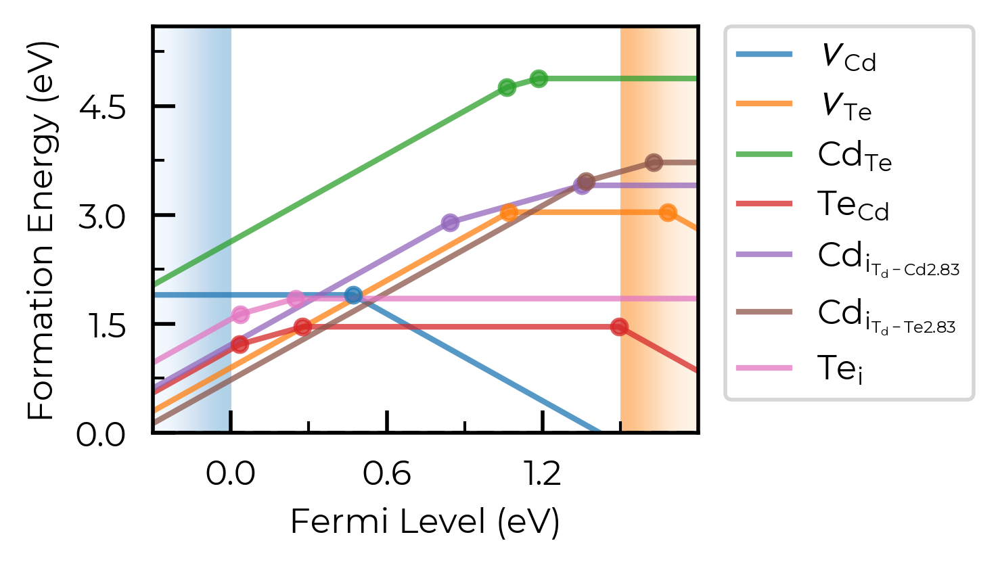

In [60]:
fig = CdTe_thermo.plot(limit="Te-rich", filename="CdTe_defects_plot.png")

## Defect Transition Level Plotting

We can use the ``plot_transition_levels()`` method of ``DefectThermodynamics`` to plot a vertical energy level / band diagram of the charge transition levels for defects in our system, with similar plotting options and functionality to ``DefectThermodynamics.plot()`` and  ``DefectThermodynamics.get_transition_levels()``.

See [Kawashima & Botti _arXiv_ 2026](https://doi.org/10.48550/arXiv.2605.23479) and [Wang et al. _ACS Energy Lett_ 2024](https://doi.org/10.1021/acsenergylett.4c02722) for nice examples.

In [11]:
%matplotlib inline
from monty.serialization import loadfn
from doped.thermodynamics import DefectThermodynamics
from doped.core import Substitution

CdTe_thermo = loadfn("CdTe/CdTe_thermo_wout_meta.json.gz")  # load our DefectThermodynamics object
Se_extrinsic_thermo = DefectThermodynamics.from_json(
    "Se/Se_Amalgamated_Extrinsic_Thermo.json.gz"
)  # load our DefectThermodynamics object
Se_extrinsic_substitutions_thermo = DefectThermodynamics(
    defect_entries=[entry for entry in Se_extrinsic_thermo.defect_entries.values()
                    if isinstance(entry.defect, Substitution)],
    chempots = Se_extrinsic_thermo.chempots,
)

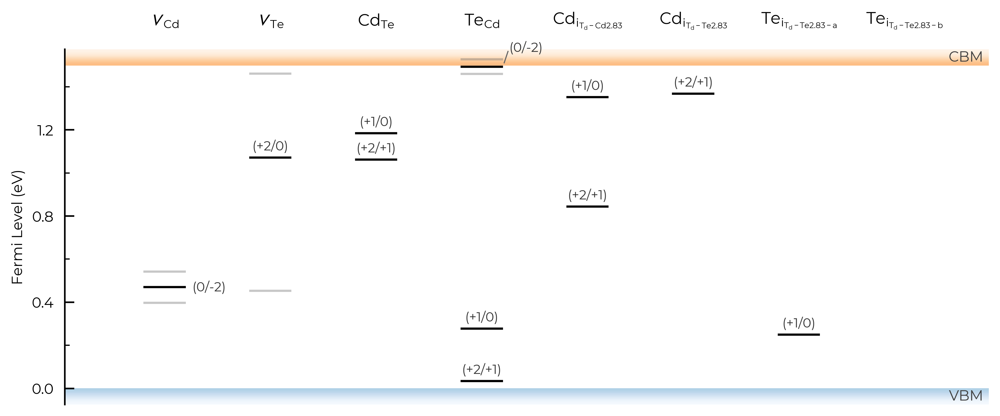

In [9]:
TL_plot = CdTe_thermo.plot_transition_levels()

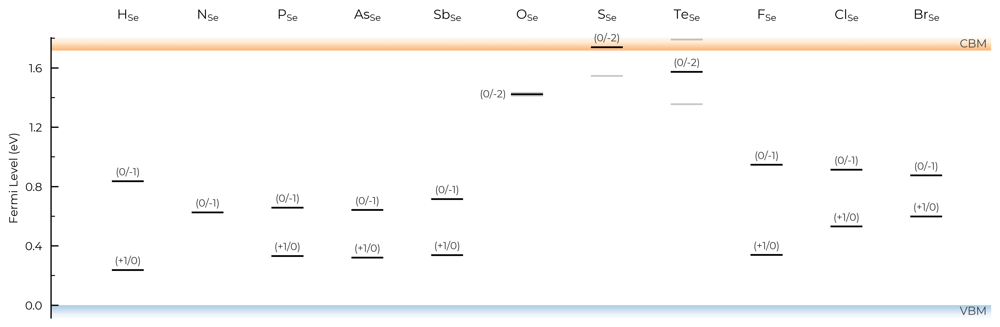

In [13]:
TL_plot = Se_extrinsic_substitutions_thermo.plot_transition_levels()

```{tip}
``DefectThermodynamics.plot_transition_level()`` uses an intelligent dynamic label placement algorithm to try and label each of the charge transition levels without having overlapping labels/lines. However, in some edge cases (e.g. with many bunched transition levels, metastable charge states etc.) this can still fail, in which case we advise saving to PDF/SVG/other vector graphic file, and manually editing (for publication-ready figures).
```

In [15]:
# run this cell to see the possible arguments for this function (or go to the python API documentation)
CdTe_thermo.plot_transition_levels?

### `all`

As with ``DefectThermodynamics.get_transition_levels`` and ``DefectThermodynamics.print_transition_levels``, we can use the `all` keyword argument to control the appearance of transition levels involving metastable charge states. The default is ``all="faded"``, where all transition levels (TLs) are shown, but metastable-containing TLs are shown faded without labels (as seen above).

If we set `all=True`, it will show and label all transition levels, metastable-containing or not:

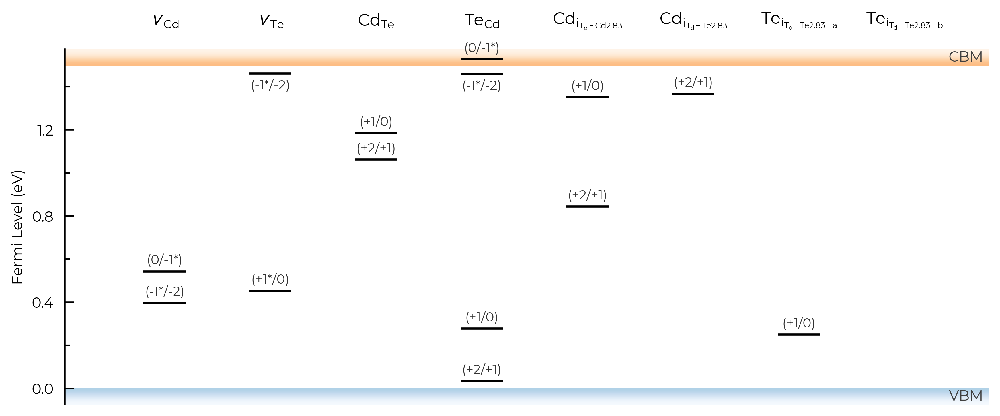

In [16]:
TL_plot = CdTe_thermo.plot_transition_levels(all=True)

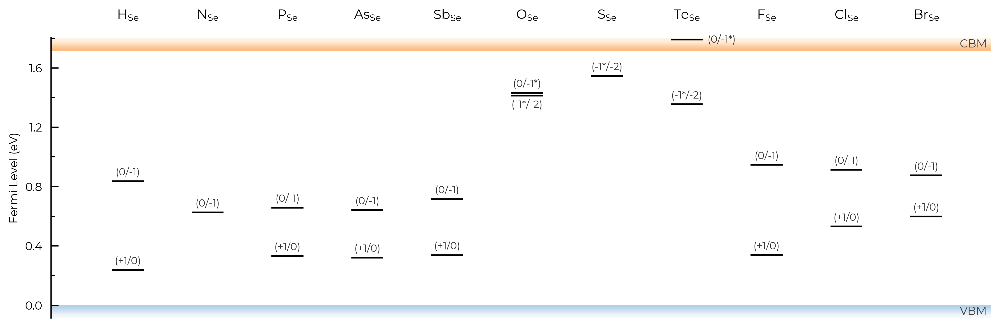

In [17]:
TL_plot = Se_extrinsic_substitutions_thermo.plot_transition_levels(all=True)

We can also set ``all="faded_labels"``, to give the same behaviour as the default ``all="faded"``, but with labels for the faded (metastable-containing) TLs:

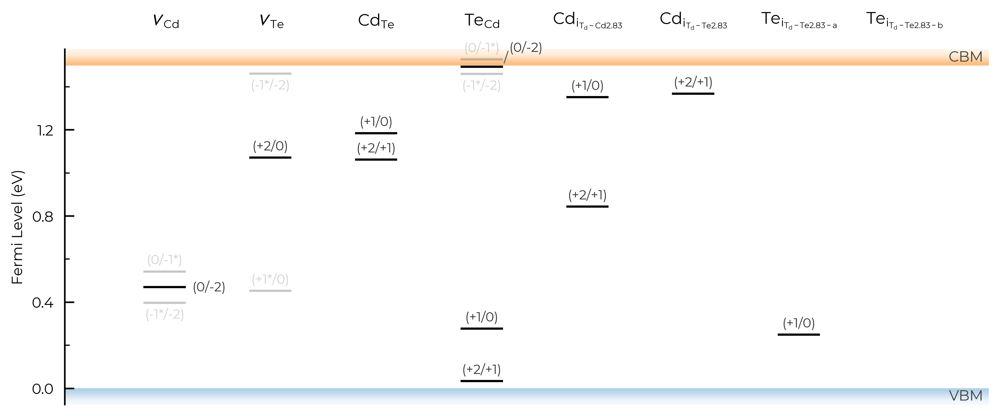

In [18]:
TL_plot = CdTe_thermo.plot_transition_levels(all="faded_labels")

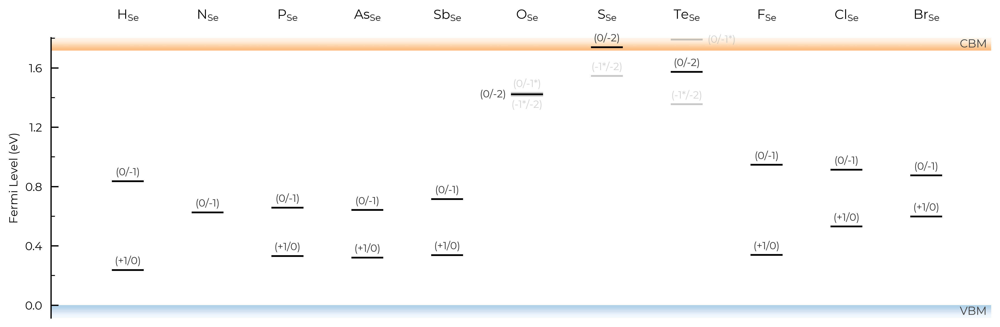

In [19]:
TL_plot = Se_extrinsic_substitutions_thermo.plot_transition_levels(all="faded_labels")

Or we can set ``all=False`` to not show any metastable-containing TLs (faded or otherwise):

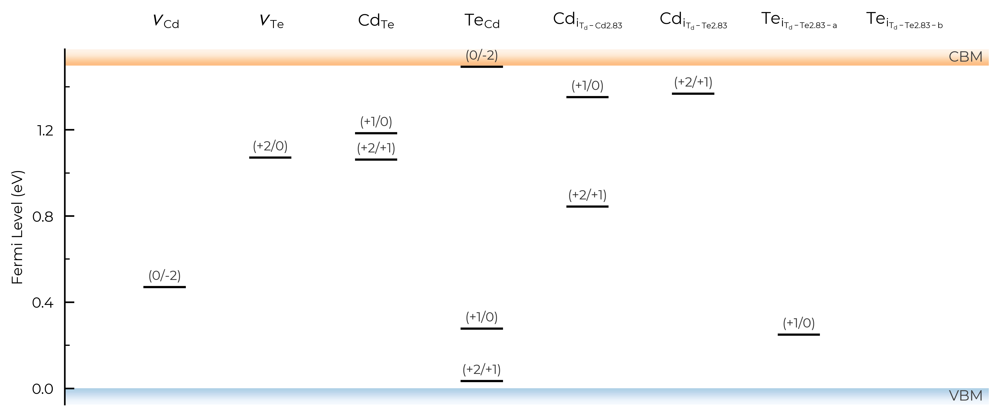

In [20]:
TL_plot = CdTe_thermo.plot_transition_levels(all=False)

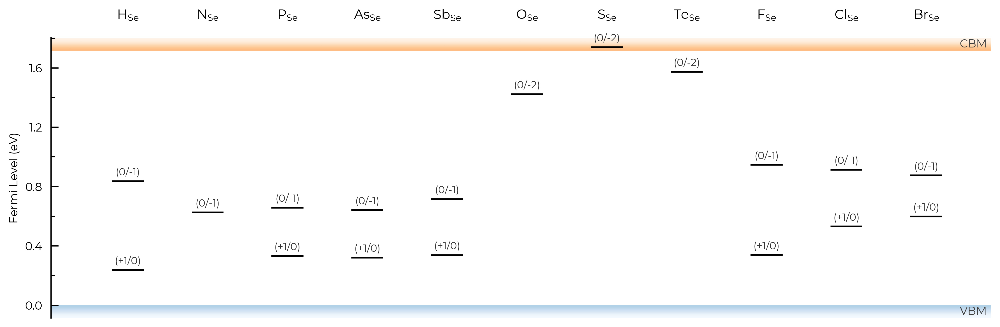

In [21]:

TL_plot = Se_extrinsic_substitutions_thermo.plot_transition_levels(all=False)

### `dist_tol` (TL Plotting)

In the above TL plots, we see `doped` classified Te interstitials in CdTe as having two separate defect sites. This is dictated by the `dist_tol` parameter in `DefectThermodynamics` (= 1.5 Å by default), which groups together defects which have distances between equivalent defect sites within this tolerance -- as discussed in the [`dist_tol` section above](#dist_tol) for defect formation energy plotting.

Let's increase it to 1.6 Å here to group these Te interstitials together:

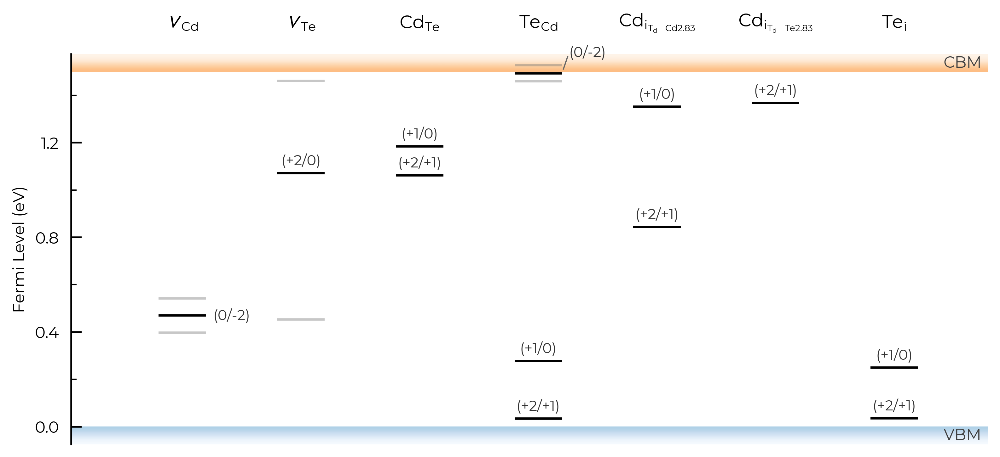

In [23]:
CdTe_thermo.dist_tol = 1.6
TL_plot = CdTe_thermo.plot_transition_levels()

If we had many inequivalent defects in a system (e.g. in low-symmetry/complex systems such as [Sb₂Se₃](https://doi.org/10.1016/j.joule.2024.05.004)), we can set `dist_tol` to a high value to merge together these many inequivalent defects so that our formation energy plot just shows the lowest energy species of each defect type. Let's quickly look at monoclinic Sb₂O₅ ([a promising Sb(V)-based transparent conducting oxide](https://doi.org/10.1021/acs.chemmater.3c03257), with several inequivalent sites) as an example case of this:

In [24]:
sb2o5_thermo = loadfn("../tests/data/Sb2O5/sb2o5_thermo.json.gz")  # load our pre-computed Sb2O5 DefectThermodynamics

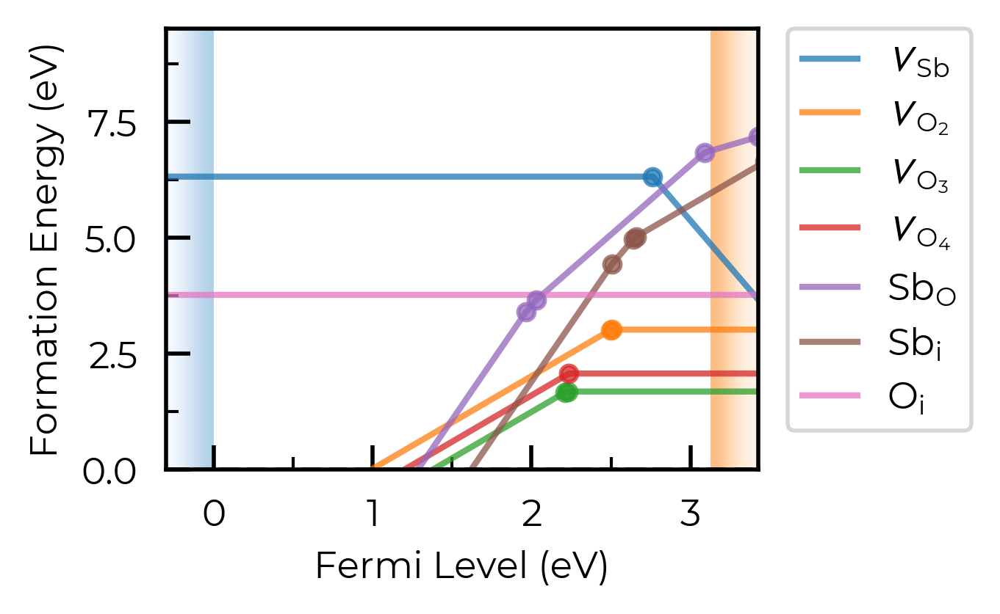

In [28]:
fig = sb2o5_thermo.plot(limit="O-poor")

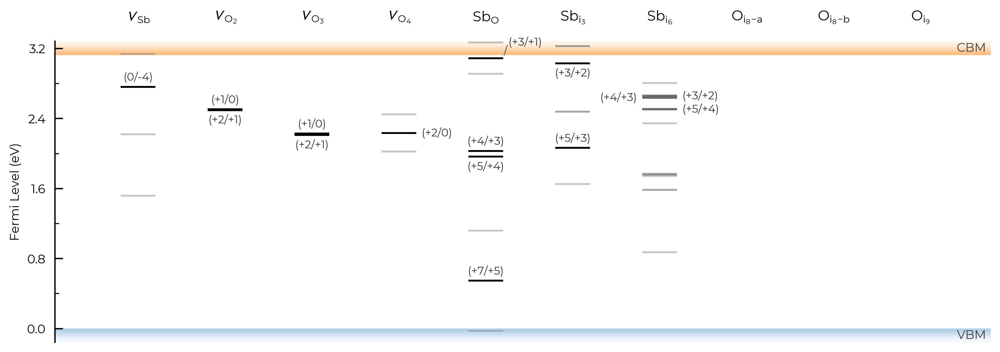

In [25]:
TL_plot = sb2o5_thermo.plot_transition_levels()

Let's set `dist_tol` to 2.5 , which will merge all inequivalent O interstitials and Sb interstitials in this case:

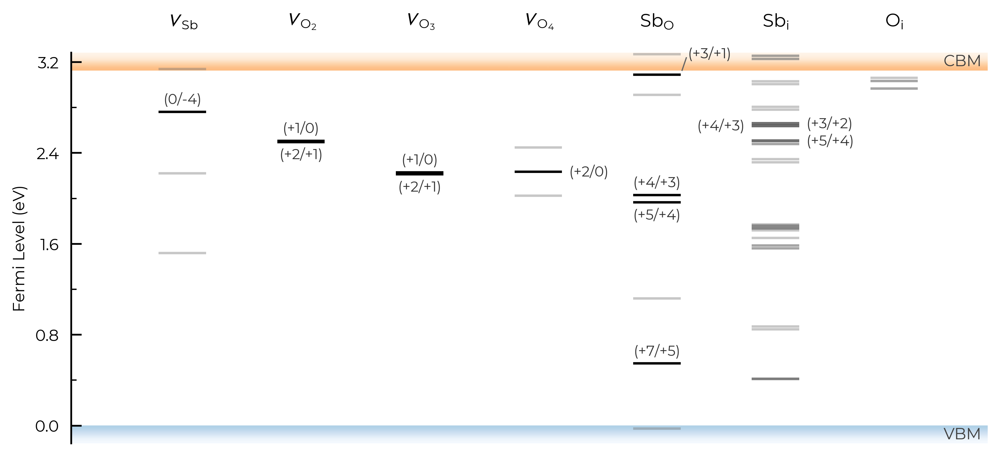

In [26]:
sb2o5_thermo.dist_tol = 2.5
TL_plot = sb2o5_thermo.plot_transition_levels()

If we set `dist_tol` even larger, to 3 Å here, this will merge all inequivalent O vacancies as well, so that only the lowest energy states are shown:

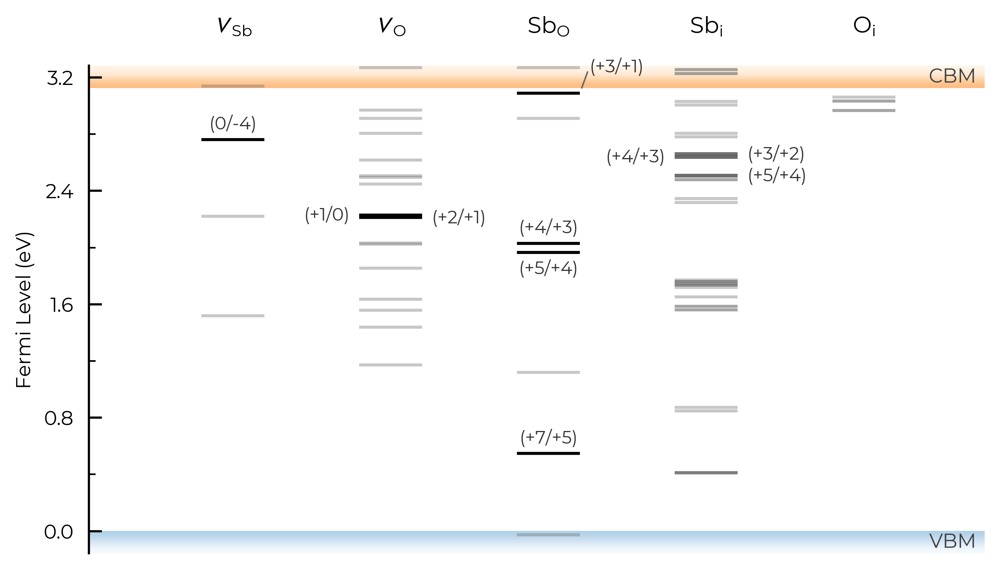

In [29]:
sb2o5_thermo.dist_tol = 3
TL_plot = sb2o5_thermo.plot_transition_levels()

See the [`dist_tol` section above](#dist_tol) for further discussion on this parameter.

### `defect_subset` (TL Plotting))

As with defect formation energy plotting, we can use the `defect_subset` argument to specify a string or list of strings, where only defects whose name contains at least one of the given (sub)strings will be plotted.

For example, let's plot just the vacancy defects:

In [ ]:
TL_plot = CdTe_thermo.plot_transition_levels(defect_subset="v_")  # 'v_' to match vacancies

Alternatively, we could achieve the same result by manually creating a vacancies-only `DefectThermodynamics` object, as shown in the formation energy plotting section.

### `unstable_entries` & `ylim`

As with formation energy plotting, we can use the ``unstable_entries`` argument to control the plotting or omission of shallow ('perturbed host') and unstable defect charge states. See the [Electronic Structure Analysis](https://doped.readthedocs.io/en/latest/Tips.html#eigenvalue-electronic-structure-analysis) section of the `doped` Tips page for more info on shallow defect states.
The default setting is ``unstable_entries = "not shallow"``, meaning entries which are
detected to be shallow ('perturbed host') states and unstable for Fermi levels in the band gap are omitted from plotting for clarity & accuracy.

Let's use the same example of extrinsic point defects in Se from the [`unstable_entries` section above](#unstable_entries) section above, showing only substitution defects (using ``defect_subset``) and also expanding our y-axis (Fermi level) limits to show tranisition levels in the band continua:

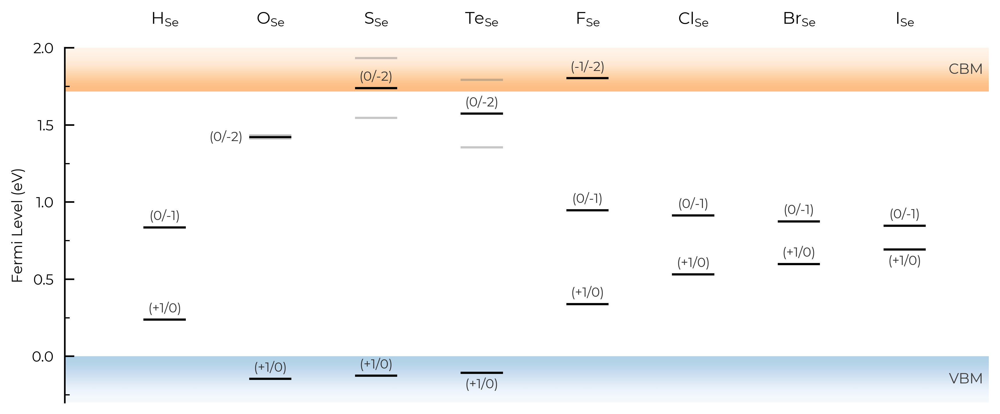

In [60]:
from doped.thermodynamics import DefectThermodynamics
Se_extrinsic_thermo = DefectThermodynamics.from_json(  # load our DefectThermodynamics object
    "../tests/data/Se_Ext_No_Pnict_Thermo.json.gz")

# no pruning of shallow/unstable states
TL_plot = Se_extrinsic_thermo.plot_transition_levels(unstable_entries=True, defect_subset="_Se", ylim=(-0.3, 2))

We can see with the default ``unstable_entries="not shallow"`` below here, some +1 charge states for chalcogen substitutions/interstitials (from this [paper on defects in Selenium](https://doi.org/10.1039/D4EE04647A)) are now omitted, being unstable for in-gap Fermi levels and having been automatically detected as shallow defects by `doped`'s eigenvalue analysis:

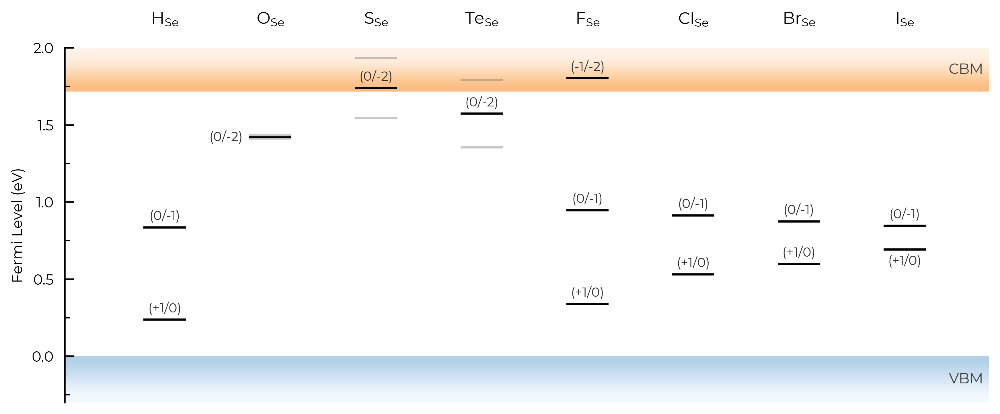

In [61]:
TL_plot = Se_extrinsic_thermo.plot_transition_levels(unstable_entries="not shallow", defect_subset="_Se", ylim=(-0.3, 2))

See the [API docs](https://doped.readthedocs.io/en/latest/doped.thermodynamics.html#doped.thermodynamics.DefectThermodynamics.plot) / docstring for more info on the available ``unstable_entries`` choices!

### `include_site_info` (TL Plotting)

The ``include_site_info`` argument controls the use of defect site information in the defect names (i.e. column names in the transition level plots). The default setting (``None``) omits site info unless needed to disambiguate distinct (grouped) defects:

In [ ]:
# show site info in all cases where available (interstitial defects here):
TL_plot = CdTe_thermo.plot_transition_levels(include_site_info=True)

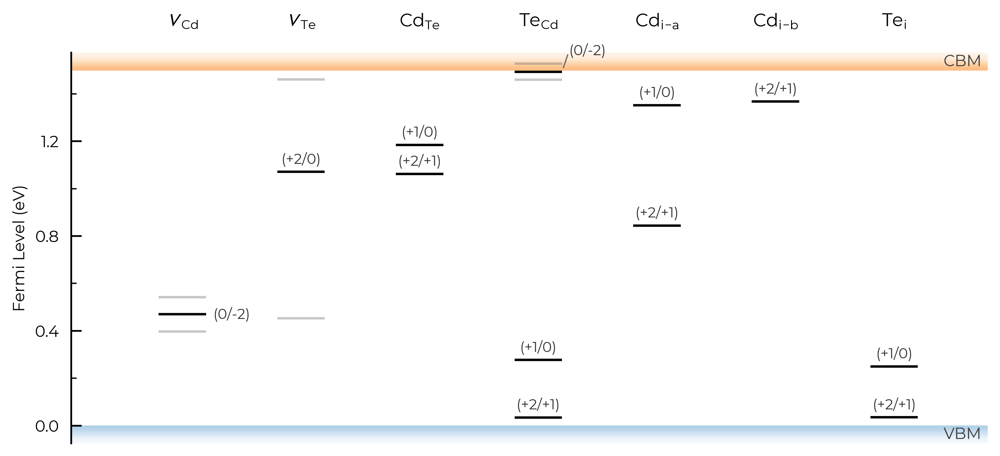

In [84]:
# don't show site info -- here the labels "Cd_i-a" and "Cd_i-b" are used to differentiate instead, while "Te_i" needs no additional labelling to disambiguate:
TL_plot = CdTe_thermo.plot_transition_levels(include_site_info=False)

### `show_charge_labels`

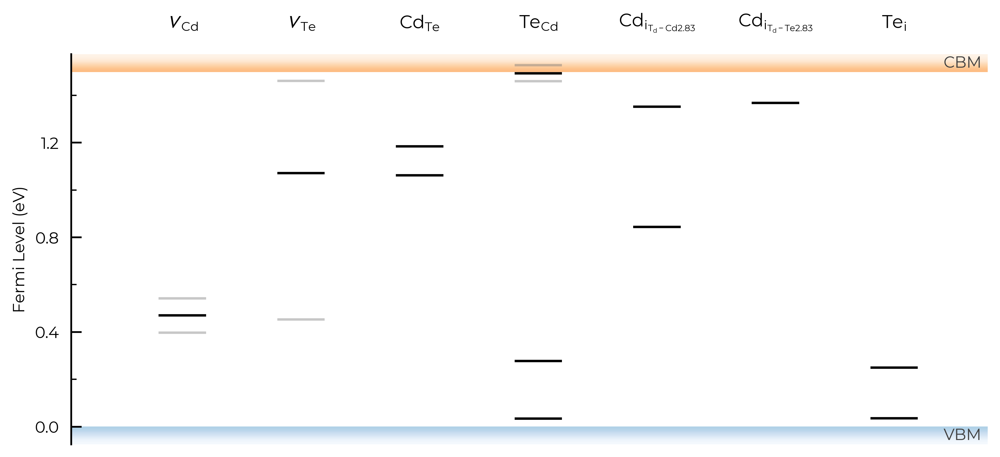

In [63]:
# no charge labels:
TL_plot = CdTe_thermo.plot_transition_levels(show_charge_labels=False)

### `show_band_labels`

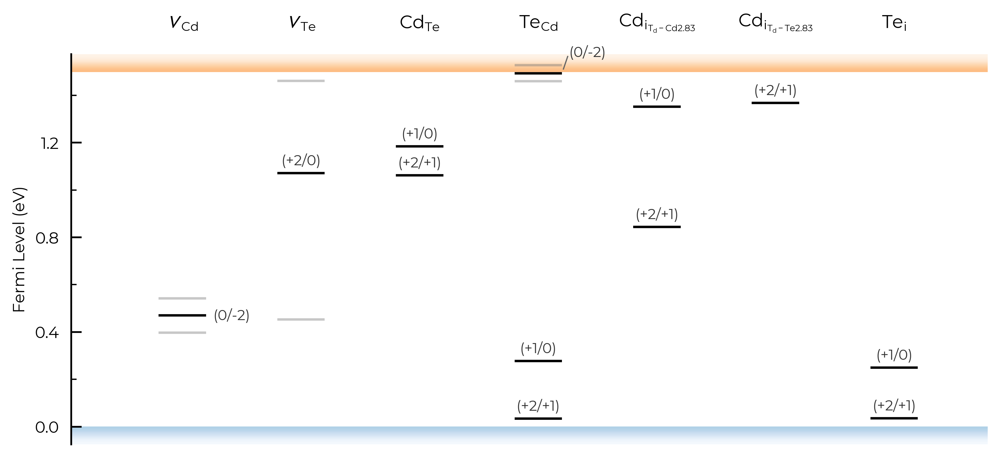

In [64]:
# no band (VBM/CBM) labels:
TL_plot = CdTe_thermo.plot_transition_levels(show_band_labels=False)

### `label_fontsize`

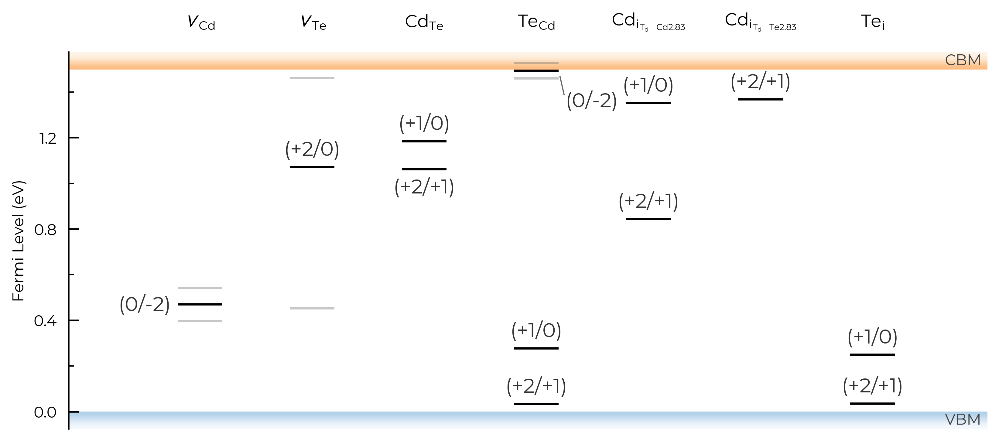

In [65]:
# adjust label fontsize:
TL_plot = CdTe_thermo.plot_transition_levels(label_fontsize=12)

### `column_width`

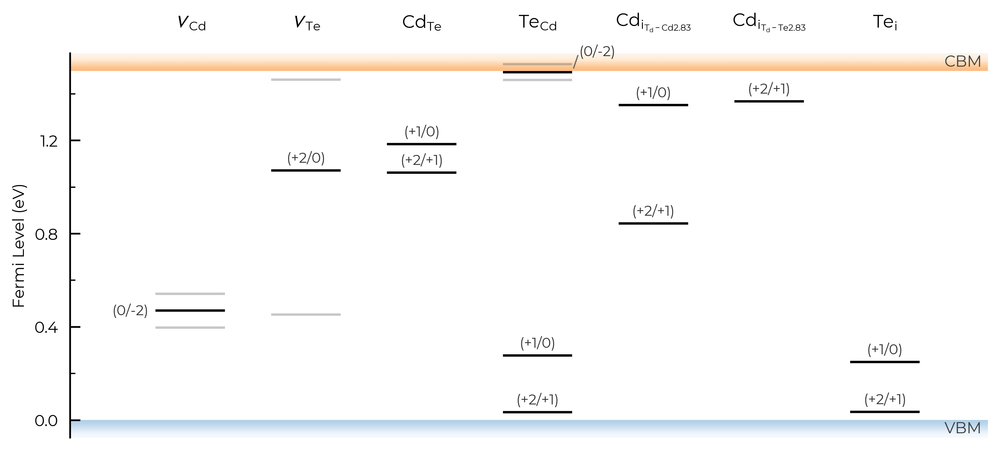

In [67]:
# adjust column width (default = 0.4):
TL_plot = CdTe_thermo.plot_transition_levels(column_width=0.6)

### `figsize`

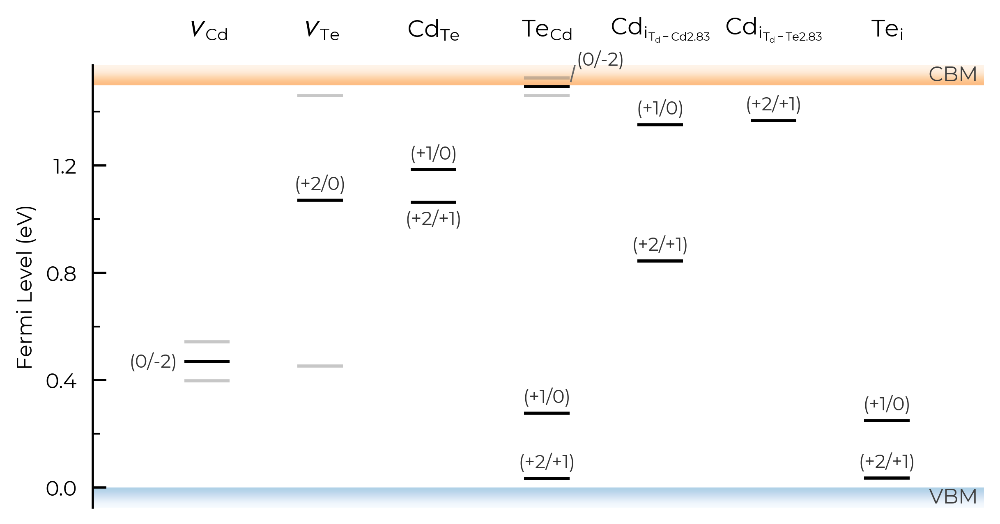

In [68]:
# adjust figure size
TL_plot = CdTe_thermo.plot_transition_levels(figsize=(7,3.5))

### `style_file` & `filename`

As with formation energy plotting, we can adjust the overall style of the plot by using a custom `matplotlib` style (`mplstyle`) file, and can also automatically save to file by providing `filename`:

In [69]:
with open("custom_style.mplstyle", "w") as f:
    f.write("ytick.right : True\nxtick.top : True\nfont.sans-serif : Helvetica")

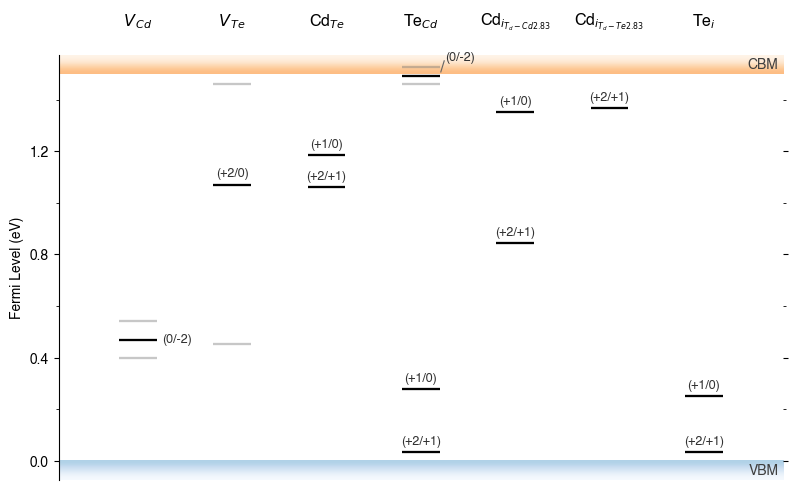

In [70]:
TL_plot = CdTe_thermo.plot_transition_levels(style_file="custom_style.mplstyle", filename="test.pdf")

In [72]:
!ls *pdf
!rm test.pdf

test.pdf


### Editing Output Figure

All ``doped`` plotting functions also return the ``matplotlib`` ``Figure`` object of the plot, and so this allows us to further edit and customise the figure as desired.

For instance, let's plot a diverging heatmap from the band gap centre decaying out to the band edges (which could indicate expected carrier emission/capture rates):

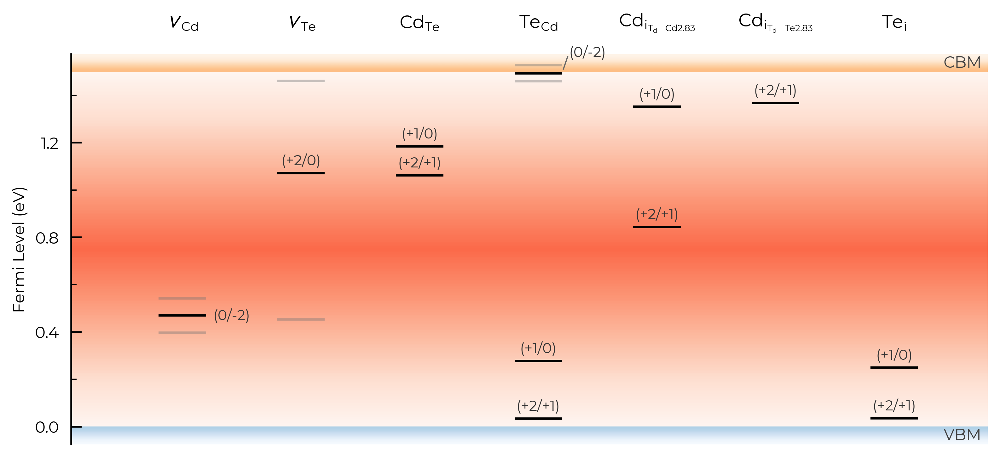

In [78]:
import numpy as np
fig = CdTe_thermo.plot_transition_levels()
ax = fig.axes[0]
xlim, ylim = ax.get_xlim(), ax.get_ylim()

# value peaks (=0) at the gap centre and decreases symmetrically towards the band edges:
y = np.linspace(ylim[0], ylim[1], 256)
profile = -np.abs(y - CdTe_thermo.band_gap / 2)
grid = np.tile(profile[:, np.newaxis], (1, 2))  # vary only along the Fermi-level (y) axis
ax.imshow(
    grid,
    extent=(xlim[0], xlim[1], ylim[0], ylim[1]),
    origin="lower",
    aspect="auto",
    cmap="Reds",
    vmin=-CdTe_thermo.band_gap / 2,  # symmetric about the gap centre
    vmax=CdTe_thermo.band_gap / 2,  # only ever reaches 50% vmax, to keep colours light and avoid greying out
    zorder=-10,  # behind the TL lines/labels
);

In other cases you may want to edit the transition levels themselves, perhaps sizing or colouring them according to their carrier capture rate, concentration, or radiative emission rate -- see [Kawashima & Botti _arXiv_ 2026](https://doi.org/10.48550/arXiv.2605.23479) for a nice example. For more complex examples such as this, you may want to directly copy and modify the ``doped`` plotting code (likely with the help of genAI, being careful to sanity check the outputs of course).

## Chemical Potential Heatmaps

The `CompetingPhasesAnalyzer.plot_chempot_heatmap` method has many options, and as always returns the `Matplotlib` `Figure` object to allow further customisation.

Chemical potential heatmap plotting requires 3-D data, requiring fixed chemical potential constraints for >ternary systems; such that the number of elements in the chemical system (5) minus the number of fixed chemical potentials (1) must be equal to 3. The following chemical potentials will additionally be constrained to their mean (centroid) values in the chemical stability region: {'Ag': np.float64(-0.1641)}


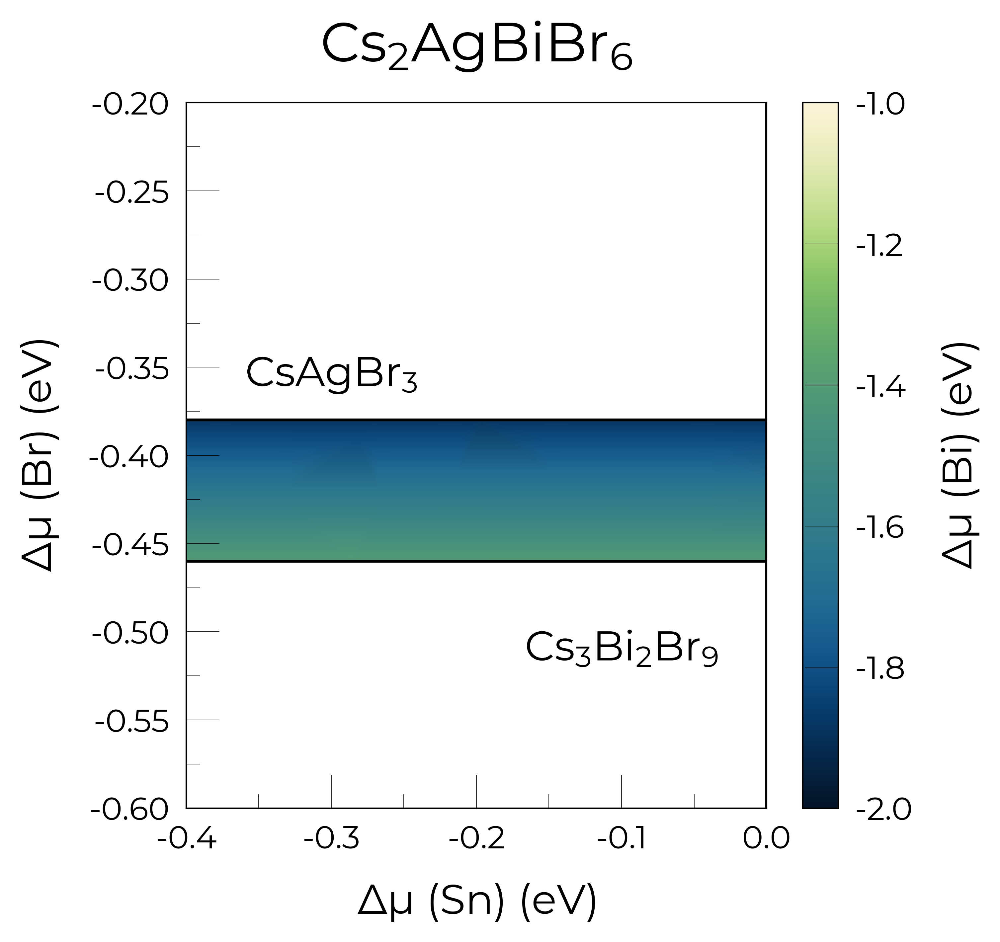

In [37]:
# 4-D system:
from monty.serialization import loadfn

Cs2AgBiBr6_ncl_cpa = loadfn("../tests/data/ChemPotAnalyzers/Sn_in_Cs2AgBiBr6_ncl_cpa.json")
plot = Cs2AgBiBr6_ncl_cpa.plot_chempot_heatmap(
    dependent_element="Bi",  # change dependent (colourbar) element
    fixed_elements={"Cs": -3.3815},
    xlim=(-0.4, 0.0),
    ylim=(-0.6, -0.2),
    cbar_range=(-2, -1),
    colormap="navia",
    padding=0.05,
    title=True,
    label_positions={
        "CsAgBr3": (-0.3, 0.025),
        "AgBr": (-0.16, 0.0),
        "Cs3Bi2Br9": (-0.1, -0.05),
    },  # custom label positions
    style_file=f"../doped/utils/displacement.mplstyle",  # custom style file
)

## Finite-Size Charge Correction Plots

Both the Freysoldt (FNV) and Kumagai (eFNV) charge correction plots in `doped` are also quite customisable, and as always return the `Matplotlib` `Figure` object to allow further customisation.

### eFNV (Kumagai) Correction

As shown in the `doped` docs [Tips page](https://doped.readthedocs.io/en/latest/Tips.html#layered-low-dimensional-materials), we can set `defect_region_radius` and/or `excluded_indices` with the eFNV correction (`get_kumagai_correction()`) to control which sites away from the defect site are used to determine the potential alignment – which we may want to do with e.g. low-dimensional materials.

In [38]:
te_cd_entry = CdTe_thermo.defect_entries["Te_Cd_+1"]

Calculated Kumagai (eFNV) correction is 0.238 eV


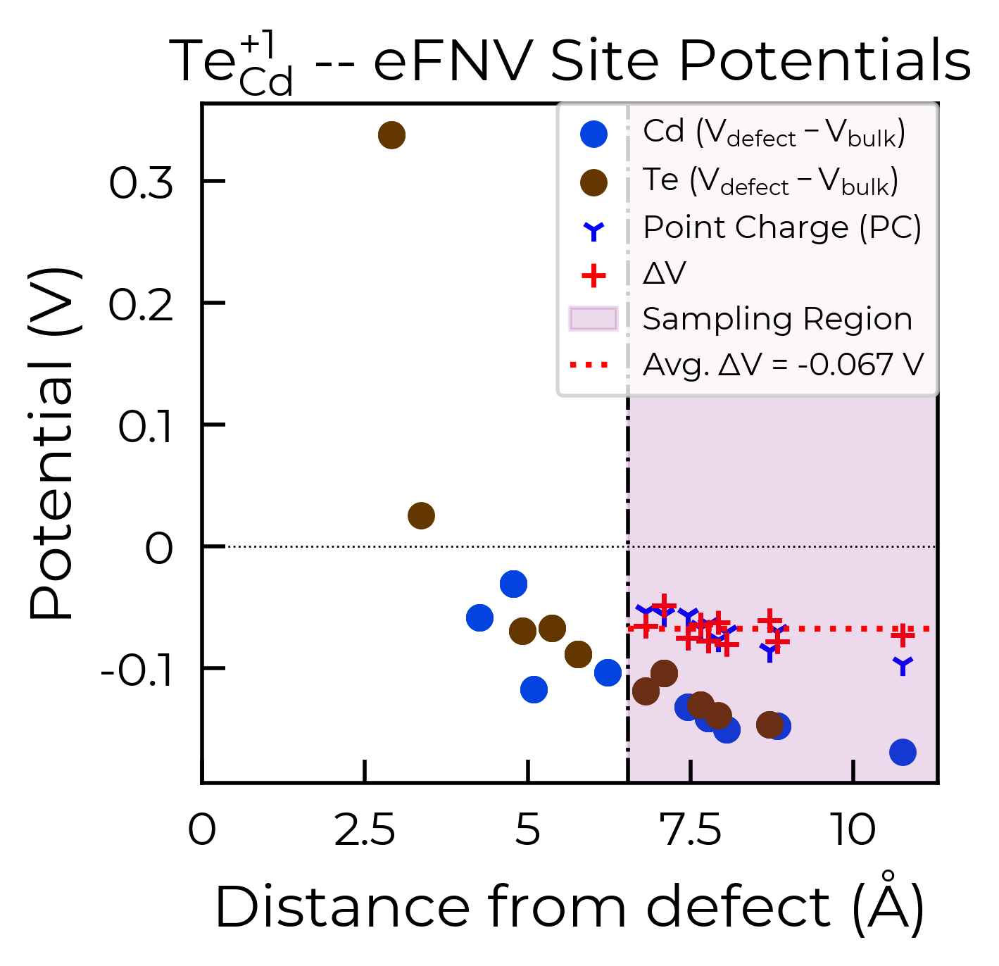

In [61]:
correction, fig = te_cd_entry.get_kumagai_correction(plot=True)

As with the defect formation energy plots, because this function also returns the `Matplotlib` `Figure` object, we can further customise the plot as we see fit. To illustrate, here we remove the legend from the plot and shade the region where the potential is positive in yellow:

Calculated Kumagai (eFNV) correction is 0.238 eV


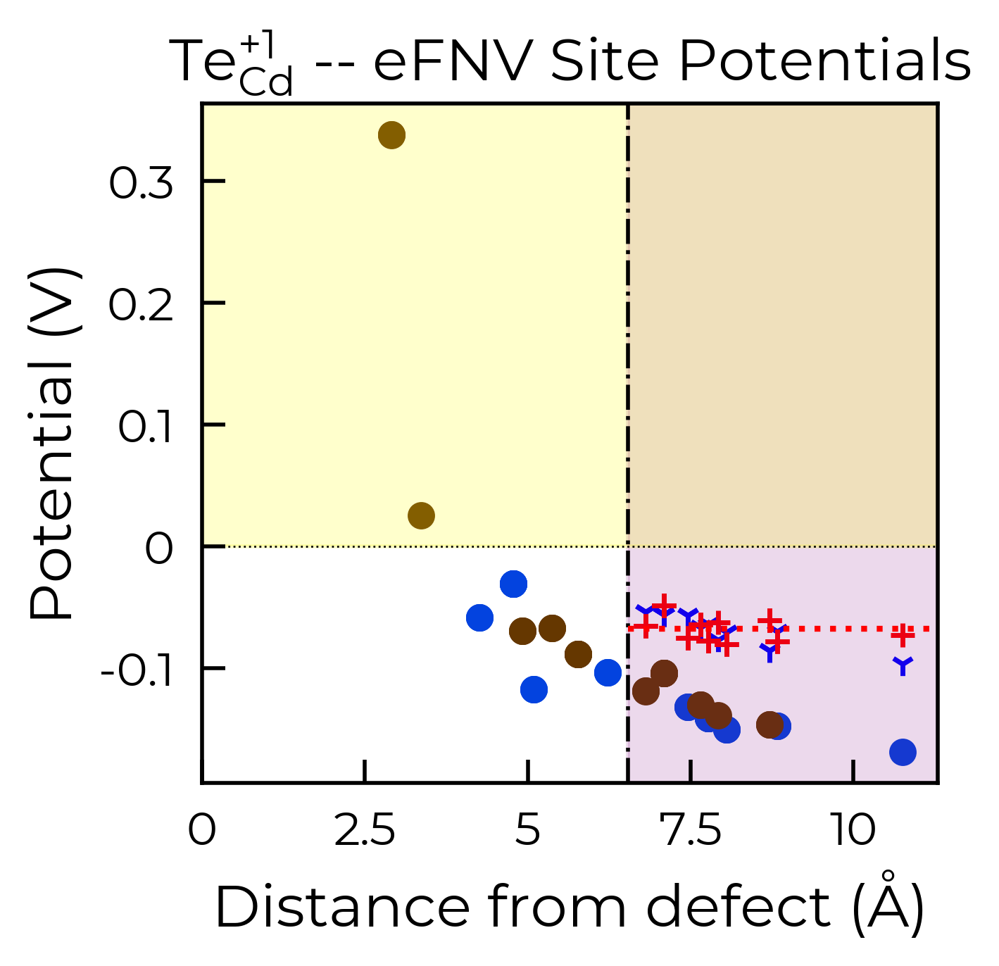

In [62]:
correction, fig = te_cd_entry.get_kumagai_correction(plot=True)
ax = fig.gca()  # get axis object
ax.get_legend().remove()  # remove legend
ax.axhspan(0, 100, alpha=0.2, color="yellow")

### `style_file` (for eFNV charge correction plots)

As with the defect formation energy plots, we can adjust the overall style of the plot by using a custom `matplotlib` style (`mplstyle`) file:

In [41]:
with open("custom_style.mplstyle", "w") as f:
    f.write("ytick.right : True\nxtick.top : True\nfont.sans-serif : Helvetica")

Calculated Kumagai (eFNV) correction is 0.238 eV


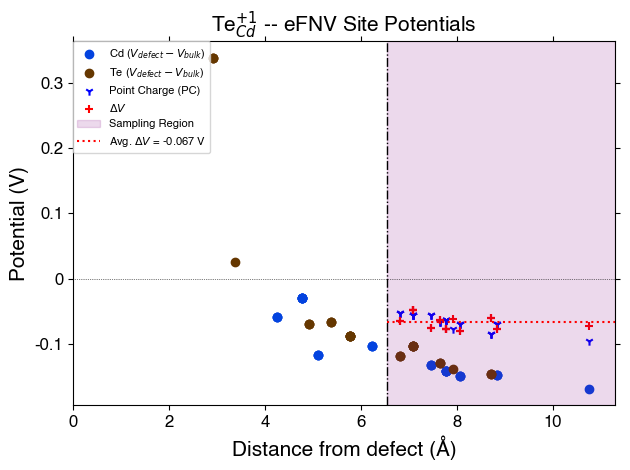

In [63]:
correction, fig = te_cd_entry.get_kumagai_correction(plot=True, style_file="custom_style.mplstyle")

### FNV (Freysoldt) Correction
Remember, the Freysoldt (FNV) correction is only valid for isotropic systems!

In [43]:
v_cd_entry = CdTe_thermo.defect_entries["v_Cd_-2"]

Calculated Freysoldt (FNV) correction is 0.738 eV


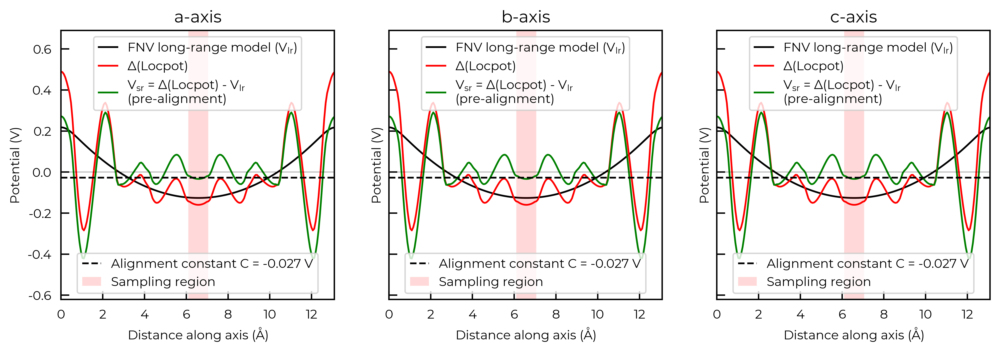

In [64]:
correction, fig = v_cd_entry.get_freysoldt_correction(plot=True)

For the FNV correction, it calculates the electrostatic potential alignment along the _a_, _b_ and _c_ axes and then computes the average. We can focus on just one axis at a time by setting `axis`:

Calculated Freysoldt (FNV) correction is 0.738 eV


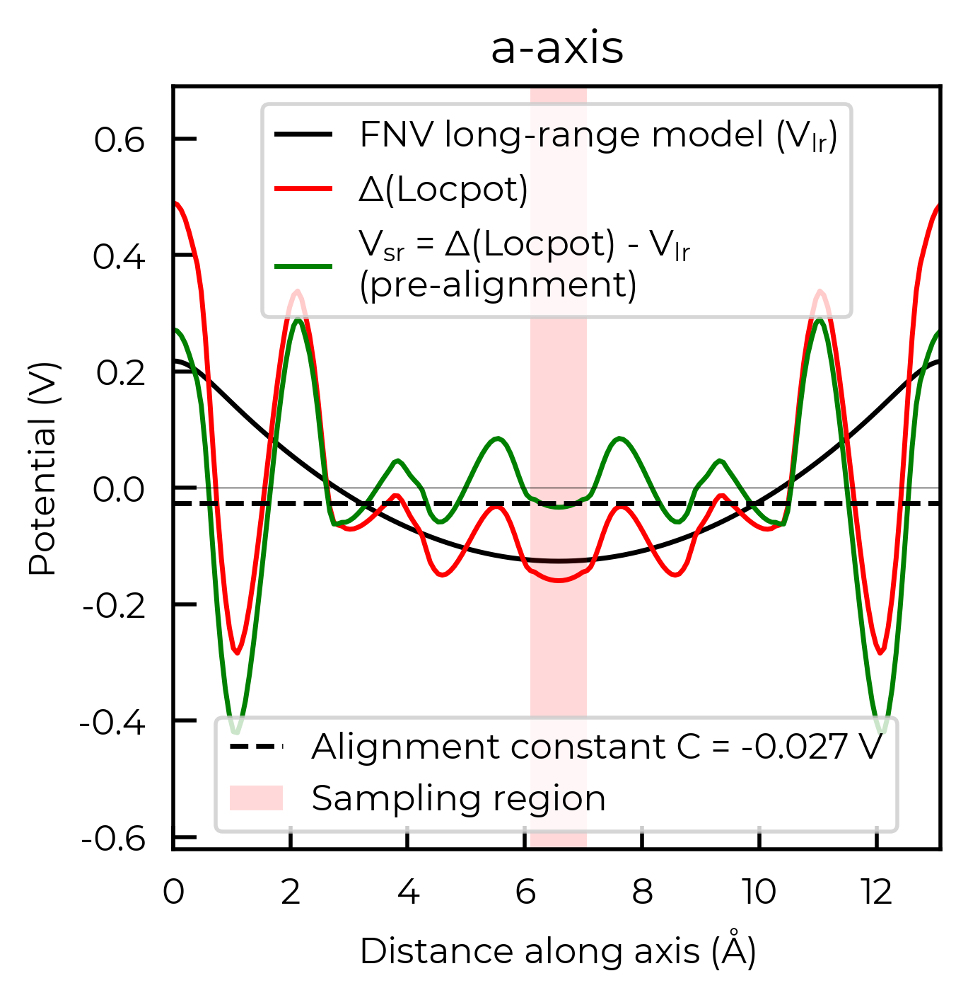

In [65]:
correction_a, fig_a = v_cd_entry.get_freysoldt_correction(plot=True, axis=0)

Again, because this function also returns the `Matplotlib` `Figure` object, we can further customise the plot as we see fit. To illustrate, here we remove the legends from each plot and shade the region where the potential is positive in yellow:

Calculated Freysoldt (FNV) correction is 0.738 eV


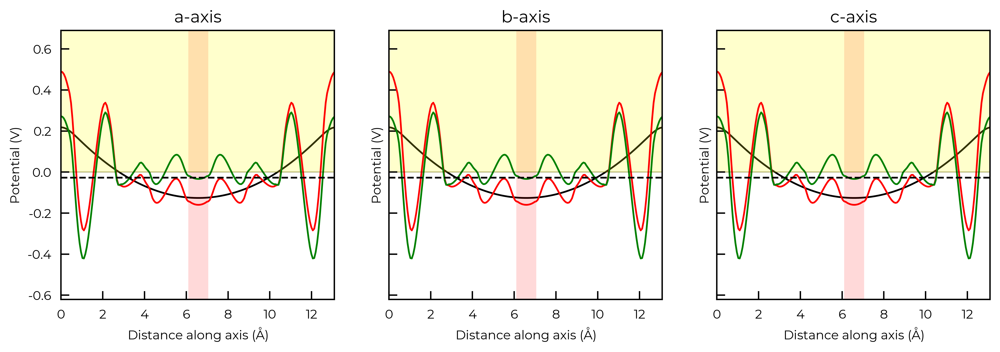

In [66]:
correction, fig = v_cd_entry.get_freysoldt_correction(plot=True)
for ax in fig.get_axes():
    ax.get_legend().remove()  # remove legend
    ax.artists[0].remove()  # shade the region where the potential is positive
    ax.axhspan(0, 100, alpha=0.2, color="yellow")

### `style_file` (for FNV charge correction plots)

As with the defect formation energy plots, we can adjust the overall style of the plot by using a custom `matplotlib` style (`mplstyle`) file:

In [47]:
with open("custom_style.mplstyle", "w") as f:
    f.write("ytick.right : True\nxtick.top : True\nfont.sans-serif : Helvetica")

Calculated Freysoldt (FNV) correction is 0.738 eV


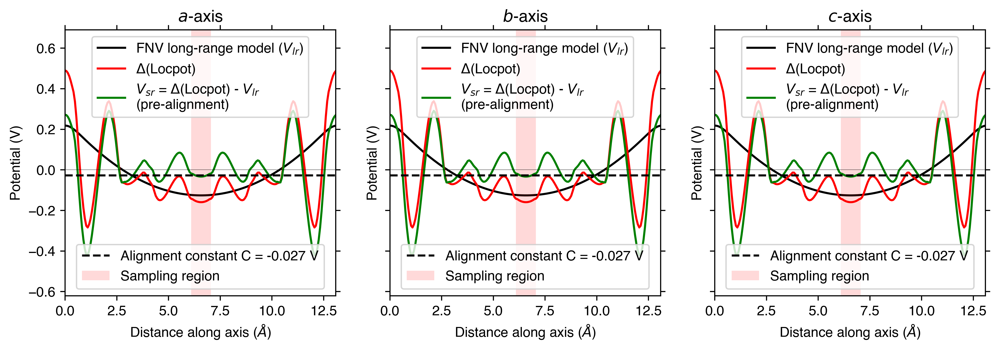

In [67]:
correction, fig = v_cd_entry.get_freysoldt_correction(plot=True, style_file="custom_style.mplstyle")

## Site Displacement / Strain Plots

As shown in more detail in the advanced analysis tutorial, the `DefectEntry.plot_site_displacements()` method and functions in `doped.utils.displacements` can be quite useful for analysing the lattice response (site displacements) and local strain for a relaxed defect structure. 

Again, these functions return the `Matplotlib` `Figure` object to allow further customisation (more examples shown in the advanced analysis tutorial):

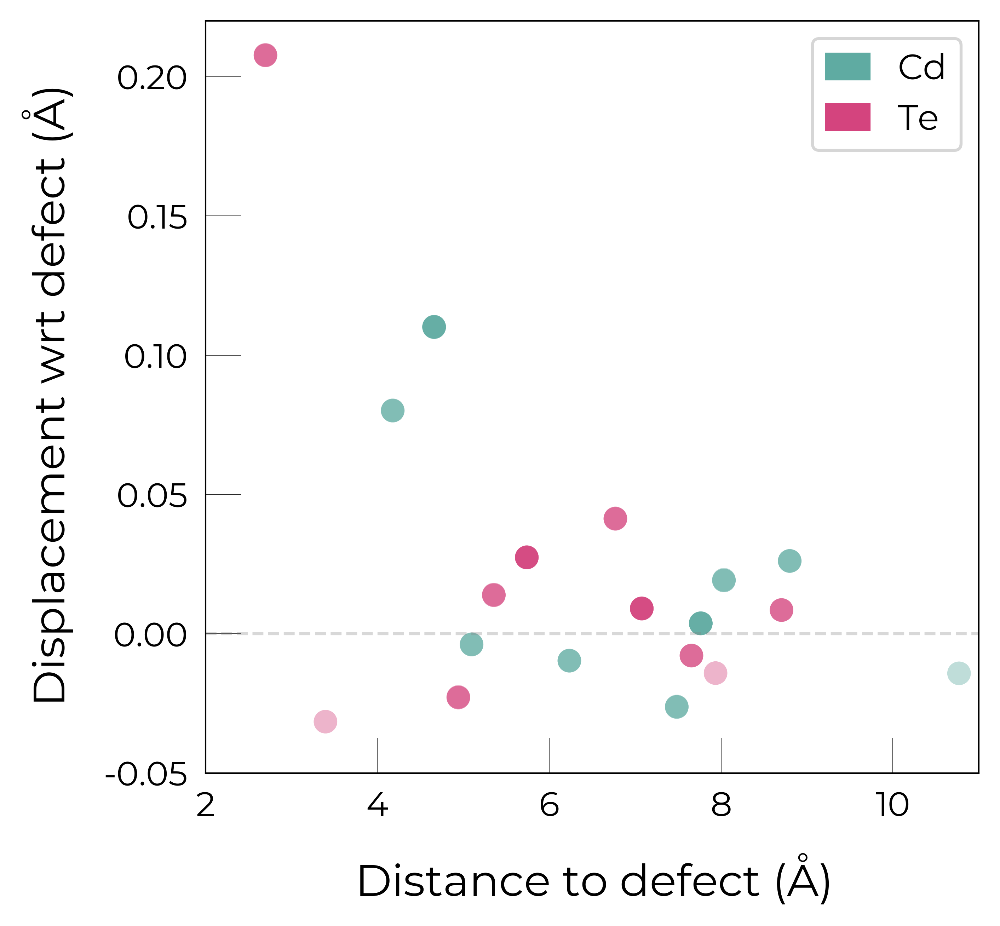

In [49]:
te_cd_entry = CdTe_thermo.defect_entries["Te_Cd_+1"]
fig = te_cd_entry.plot_site_displacements()
ax = fig.gca()
ax.set_xlim(2, 11)
ax.set_ylim(-0.05, 0.22);  # adjust x/y-lims

## Eigenvalue Plots

As shown in more detail in the advanced analysis tutorial, the `DefectEntry.get_eigenvalue_analysis()` method and functions in `doped.utils.eigenvalues` can be quite useful for analysing the electronic structure of our defect calculations.

Again, these functions return the `Matplotlib` `Figure` object to allow further customisation:

((-0.2, 1.8), <matplotlib.lines.Line2D at 0x3b68651d0>)

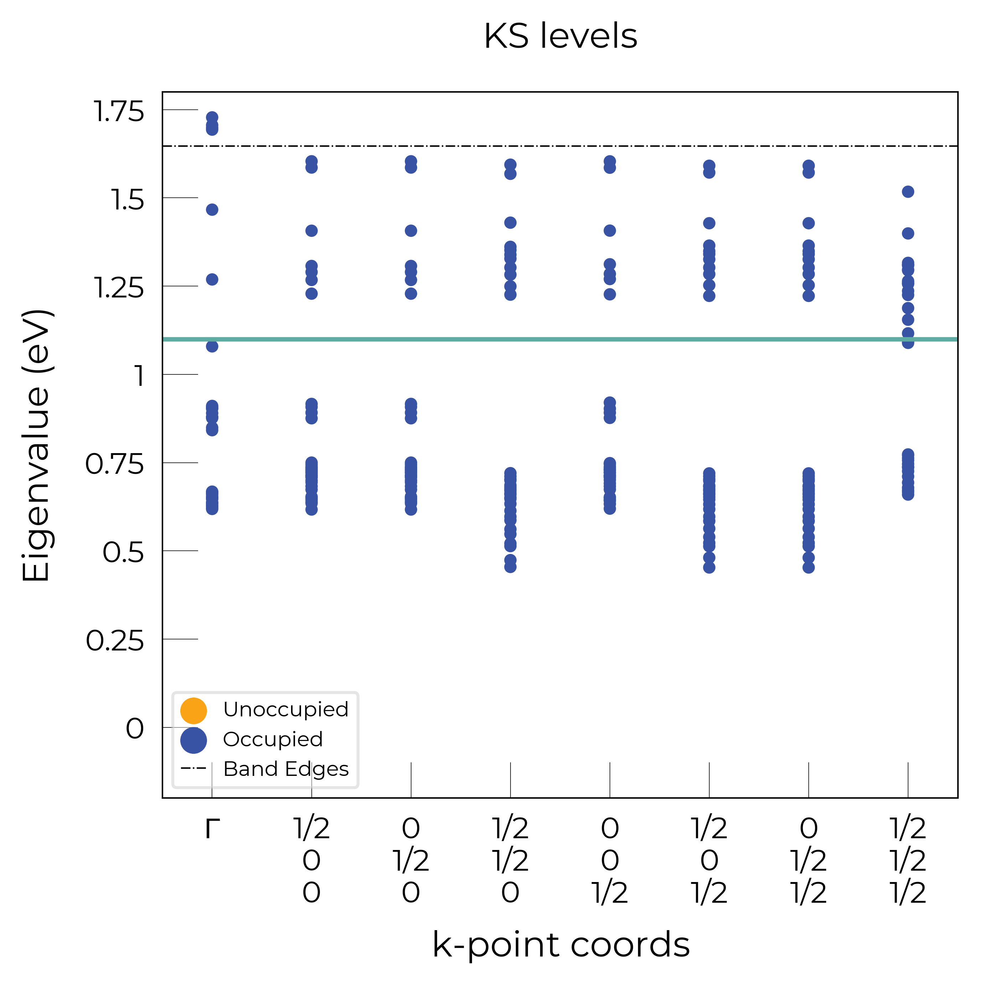

In [68]:
te_cd_entry = CdTe_thermo.defect_entries["Te_Cd_+1"]
bes, fig = te_cd_entry.get_eigenvalue_analysis()
# adjust ylim and add line around defect level:
ax = fig.axes[0]
ax.set_ylim(-0.2, 1.8), ax.axhline(1.1)